<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/MiCADO2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Emptyl](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


In [3]:
%%capture
!pip install plotly
!pip install chart-studio
!pip install pyit2fls

In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import chart_studio.plotly as py
import plotly.graph_objects as go

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

from sklearn import preprocessing

from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from plotly.offline import iplot
from mpl_toolkits.mplot3d import Axes3D

from ipywidgets import IntSlider
from ipywidgets import HTML
from ipywidgets import interact, interactive, fixed, interact_manual

import pickle
import warnings
warnings.filterwarnings('ignore')


In [4]:
#@title
from matplotlib import pyplot
from math import cos, sin, atan
from palettable.tableau import Tableau_10
from time import localtime, strftime
import numpy as np

class Neuron():
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def draw(self, neuron_radius, id=-1, name=None):
        circle = pyplot.Circle((self.x, self.y), radius=neuron_radius, fill=False)
        pyplot.gca().add_patch(circle)
        pyplot.gca().text(self.x, self.y-0.15, str(id), size=10, ha='center')
        if name is not None:
          pyplot.gca().text(self.x+0.05, self.y-0.5, str(name), size=20, ha='center', va='top', rotation='vertical')

class Layer():
    def __init__(self, network, number_of_neurons, number_of_neurons_in_widest_layer, input_names=None):
        self.vertical_distance_between_layers = 6
        self.horizontal_distance_between_neurons = 2
        self.neuron_radius = 0.5
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.previous_layer = self.__get_previous_layer(network)
        self.y = self.__calculate_layer_y_position()
        self.neurons = self.__intialise_neurons(number_of_neurons)
        self.input_names = input_names

    def __intialise_neurons(self, number_of_neurons):
        neurons = []
        x = self.__calculate_left_margin_so_layer_is_centered(number_of_neurons)
        for iteration in range(number_of_neurons):
            neuron = Neuron(x, self.y)
            neurons.append(neuron)
            x += self.horizontal_distance_between_neurons
        return neurons

    def __calculate_left_margin_so_layer_is_centered(self, number_of_neurons):
        return self.horizontal_distance_between_neurons * (self.number_of_neurons_in_widest_layer - number_of_neurons) / 2

    def __calculate_layer_y_position(self):
        if self.previous_layer:
            return self.previous_layer.y + self.vertical_distance_between_layers
        else:
            return 0

    def __get_previous_layer(self, network):
        if len(network.layers) > 0:
            return network.layers[-1]
        else:
            return None

    def __line_between_two_neurons(self, neuron1, neuron2, weight=0.4, textoverlaphandler=None):
        angle = atan((neuron2.x - neuron1.x) / float(neuron2.y - neuron1.y))
        x_adjustment = self.neuron_radius * sin(angle)
        y_adjustment = self.neuron_radius * cos(angle)

        # assign colors to lines depending on the sign of the weight
        color=Tableau_10.mpl_colors[0]
        if weight > 0: color=Tableau_10.mpl_colors[1]

        # assign different linewidths to lines depending on the size of the weight
        abs_weight = abs(weight)        
        if abs_weight > 0.5: 
            linewidth = 5*abs_weight
        elif abs_weight > 0.8: 
            linewidth =  50*abs_weight
        else:
            linewidth = abs_weight

        # draw the weights and adjust the labels of weights to avoid overlapping
        if abs_weight > 0.5: 
            # while loop to determine the optimal locaton for text lables to avoid overlapping
            index_step = 2
            num_segments = 10   
            txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
            txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments
            while ((not textoverlaphandler.getspace([txt_x_pos-0.5, txt_y_pos-0.5, txt_x_pos+0.5, txt_y_pos+0.5])) and index_step < num_segments):
                index_step = index_step + 1
                txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
                txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments

            # print("Label positions: ", "{:.2f}".format(txt_x_pos), "{:.2f}".format(txt_y_pos), "{:3.2f}".format(weight))
            a=pyplot.gca().text(txt_x_pos, txt_y_pos, "{:3.2f}".format(weight), size=12, ha='center')
            a.set_bbox(dict(facecolor='white', alpha=0))
            # print(a.get_bbox_patch().get_height())

        line = pyplot.Line2D((neuron1.x - x_adjustment, neuron2.x + x_adjustment), (neuron1.y - y_adjustment, neuron2.y + y_adjustment), linewidth=linewidth, color=color)
        pyplot.gca().add_line(line)

    def draw(self, layerType=0, weights=None, textoverlaphandler=None):
        j=0 # index for neurons in this layer
        z=0 # counter for names
        for neuron in self.neurons:            
            i=0 # index for neurons in previous layer
            if(layerType==0):
              name = self.input_names[z]
              neuron.draw( self.neuron_radius, id=j+1, name=name)
            else:
              neuron.draw( self.neuron_radius, id=j+1)
            if self.previous_layer:
                for previous_layer_neuron in self.previous_layer.neurons:
                    self.__line_between_two_neurons(neuron, previous_layer_neuron, weights[i,j], textoverlaphandler)
                    i=i+1
            j=j+1
            z=z+1
        
        # write Text
        x_text = self.number_of_neurons_in_widest_layer * self.horizontal_distance_between_neurons
        if layerType == 0:
            pyplot.text(x_text, self.y, 'Input Layer', fontsize = 12)
        elif layerType == -1:
            pyplot.text(x_text, self.y, 'Output Layer', fontsize = 12)
        else:
            pyplot.text(x_text, self.y, 'Hidden Layer '+str(layerType), fontsize = 12)

# A class to handle Text Overlapping
# The idea is to first create a grid space, if a grid is already occupied, then
# the grid is not available for text labels.
class TextOverlappingHandler():
    # initialize the class with the width and height of the plot area
    def __init__(self, width, height, grid_size=0.2):
        self.grid_size = grid_size
        self.cells = np.ones((int(np.ceil(width / grid_size)), int(np.ceil(height / grid_size))), dtype=bool)

    # input test_coordinates(bottom left and top right), 
    # getspace will tell you whether a text label can be put in the test coordinates
    def getspace(self, test_coordinates):
        x_left_pos = int(np.floor(test_coordinates[0]/self.grid_size))
        y_botttom_pos = int(np.floor(test_coordinates[1]/self.grid_size))
        x_right_pos = int(np.floor(test_coordinates[2]/self.grid_size))
        y_top_pos = int(np.floor(test_coordinates[3]/self.grid_size))
        if self.cells[x_left_pos, y_botttom_pos] and self.cells[x_left_pos, y_top_pos] \
        and self.cells[x_right_pos, y_top_pos] and self.cells[x_right_pos, y_botttom_pos]:
            for i in range(x_left_pos, x_right_pos):
                for j in range(y_botttom_pos, y_top_pos):
                    self.cells[i, j] = False

            return True
        else:
            return False

class NeuralNetwork():
    def __init__(self, number_of_neurons_in_widest_layer, input_names=None):
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.layers = []
        self.layertype = 0
        self.input_names = []
        if (input_names == None):
            self.input_names = []
        else:
            self.input_names = input_names

    def add_layer(self, number_of_neurons ):
        layer = Layer(self, number_of_neurons, self.number_of_neurons_in_widest_layer, self.input_names)
        self.layers.append(layer)

    def draw(self, weights_list=None, input_names=None):
        # vertical_distance_between_layers and horizontal_distance_between_neurons are the same with the variables of the same name in layer class
        vertical_distance_between_layers = 6
        horizontal_distance_between_neurons = 2
        overlaphandler = TextOverlappingHandler(\
            self.number_of_neurons_in_widest_layer*horizontal_distance_between_neurons,\
            len(self.layers)*vertical_distance_between_layers, grid_size=0.2 )

        if( len(self.input_names) <= 10 ):
          pyplot.figure(figsize=(12, 9))
        elif( len(self.input_names) > 10 ):
          pyplot.figure(figsize=(24, 10))
        else:
          pyplot.figure(figsize=(12,9))
        for i in range( len(self.layers) ):
            layer = self.layers[i]                                
            if i == 0:
                layer.draw( layerType=0 )
            elif i == len(self.layers)-1:
                layer.draw( layerType=-1, weights=weights_list[i-1], textoverlaphandler=overlaphandler)
            else:
                layer.draw( layerType=i, weights=weights_list[i-1], textoverlaphandler=overlaphandler)

        pyplot.axis('scaled')
        pyplot.axis('off')
        pyplot.title( 'Neural Network architecture', fontsize=15 )
        figureName='ANN_'+strftime("%Y%m%d_%H%M%S", localtime())+'.png'
        pyplot.savefig(figureName, dpi=300, bbox_inches="tight")
        pyplot.show()

class DrawNN():
    # para: neural_network is an array of the number of neurons 
    # from input layer to output layer, e.g., a neural network of 5 nerons in the input layer, 
    # 10 neurons in the hidden layer 1 and 1 neuron in the output layer is [5, 10, 1]
    # para: weights_list (optional) is the output weights list of a neural network which can be obtained via classifier.coefs_
    def __init__( self, neural_network, weights_list=None, input_names=None ):
        # self.input_names = input_names
        self.neural_network = neural_network
        self.weights_list = weights_list
        # if input_names exists
        if input_names is None:
          self.input_names = []
        else:
          self.input_names = input_names
        # if weights_list is none, then create a uniform list to fill the weights_list
        if weights_list is None:
            weights_list=[]
            for first, second in zip(neural_network, neural_network[1:]):
                tempArr = np.ones((first, second))*0.4
                weights_list.append(tempArr)
            self.weights_list = weights_list
        
    def draw( self ):
        widest_layer = max( self.neural_network )
        network = NeuralNetwork( widest_layer, self.input_names)
        for l in self.neural_network:
            network.add_layer(l)
        network.draw(self.weights_list)

In [5]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


In [6]:
!wget https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_2777.csv

!wget https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_pk_hosszu_clean-roviditett.csv

--2021-06-27 12:24:48--  https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_2777.csv
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JoDeMiro/Data/main/Micado/nn_training_data_2777.csv [following]
--2021-06-27 12:24:49--  https://raw.githubusercontent.com/JoDeMiro/Data/main/Micado/nn_training_data_2777.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 536472 (524K) [text/plain]
Saving to: ‘nn_training_data_2777.csv’

nn_training_data_27 100%[===================>] 523.90K  --.-KB/s    in 0.03s   

2021-06-27 12:24:49 (18.1 MB/s) - ‘nn_training_data_2777.csv’ saved [536472/536472]

In [45]:
df = pd.read_csv('nn_training_data_2777.csv')

df = pd.read_csv('nn_training_data_pk_hosszu_clean-roviditett.csv')

In [46]:
df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
0,1565842767,0.266626,0.026494,0.047099,1024.008182,2115.241545,0.711718,7.735698,0.141352,0.199977,3,12740.186333
1,1565842808,0.283311,0.027179,0.050000,987.586756,2043.233727,0.711481,7.399414,0.150002,0.199987,3,13139.585667
2,1565842838,0.249975,0.025420,0.050001,1011.356340,2083.687078,0.715838,7.312479,0.150002,0.249958,3,12802.591667
3,1565842870,0.199973,0.022588,0.050004,1004.221791,2055.854785,0.713138,6.995615,0.150011,0.199973,3,12740.186333
4,1565842902,0.266710,0.026501,0.050000,1051.027597,2142.868860,0.715171,7.564387,0.150001,0.233363,4,12997.365333


In [47]:
# gyors időbeli áttekintés

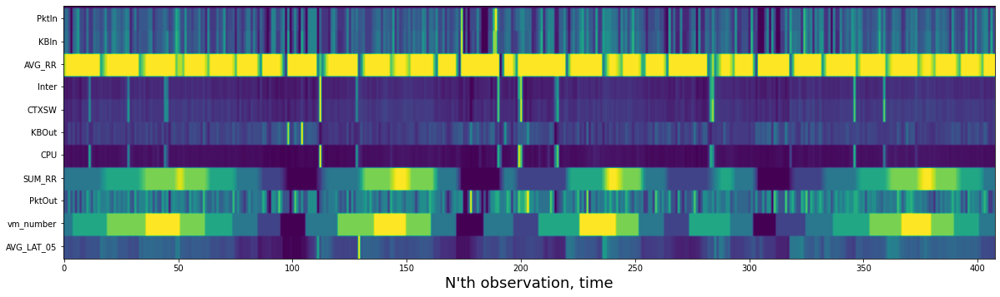

In [48]:
X = df.values

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

h = np.zeros((1, df.shape[0]))

for i, v in enumerate(df.columns):
  if( v != 'timestamp'):
    col = X_scaled[:,i]
    size = col.size
    col = col.reshape((1, col.size))
    col = col.T
    col = col.repeat(10, axis=0)
    col = col.reshape((size, 10))
    h = np.concatenate((h, col.T), axis=0)

# print(df.columns)
print('')
labels = df.columns[1:]
y = np.arange(5, 115, 10)
plt.figure(figsize=(20, 7)); plt.imshow(h); plt.yticks(y, labels, rotation='horizontal'); plt.xlabel('N\'th observation, time', fontsize=18); plt.show()

In [49]:
# gyors testzek a változókra

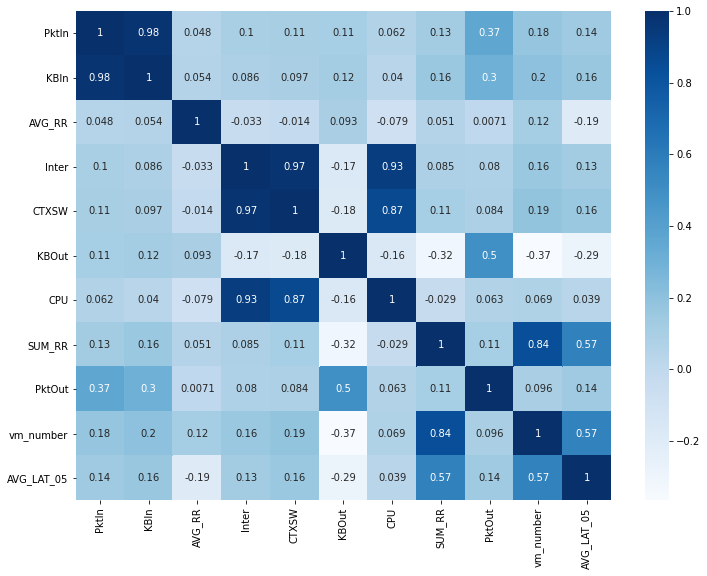

In [50]:
# korrelácó az egyes változók között
corr = df.iloc[: , 1:].corr()

plt.figure(figsize=(12,9))
sns.heatmap(corr, cmap="Blues", annot=True)
# plt.savefig('correlation_matrix.png')
plt.show()


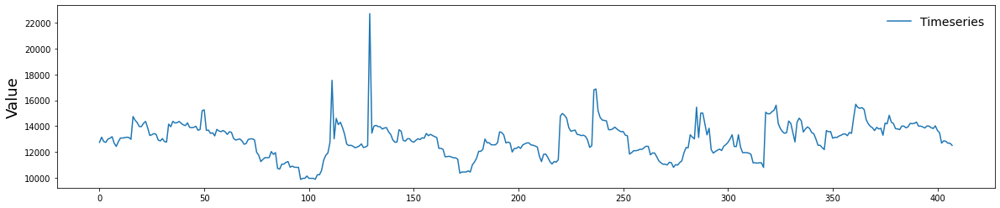

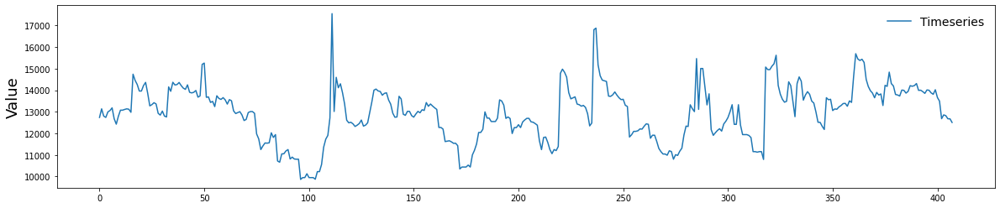

In [16]:
timeline(df['AVG_LAT_05'])

df = df[df['AVG_LAT_05'] < 20000]

timeline(df['AVG_LAT_05'])


In [17]:
# Keressük meg azokat az adatokat ahol változott a gépek száma

In [18]:
def createBeforeafterDF(df, lag, inputMetrics):
    beforeafterDF = df.copy()
    length = len(inputMetrics)
    # print(length)
    inputVariables = np.flip(beforeafterDF.columns[0:length].ravel(), axis=-1)
    # print('Input Variablels : ', inputVariables)

    index = length
    for i in inputVariables:
        new_column = beforeafterDF[i].shift(lag)
        new_column_name = (i + str(1)) # Todo: rename str(lag)
        beforeafterDF.insert(loc=index, column=new_column_name, value=new_column)

    beforeafterDF = beforeafterDF[lag:]

    return beforeafterDF

# Fontos
metrics = df.columns

# Before After adatok egy sorban
ba = createBeforeafterDF(df, 1, metrics)

# Csak azok az adatok ahol tényleges eltérés volt a gépek száma között
def createScalingDF(theBeforeAfterDF):
  new_beforeafterDF = theBeforeAfterDF.copy()
  scalingDF = new_beforeafterDF[new_beforeafterDF.vm_number != new_beforeafterDF.vm_number1]
  return scalingDF

fd = createScalingDF(ba)

rossz = fd.copy()

# Ki kell szűrni azokat az eseteket, ahol egynél több gépet adott hozzá, vagy vett el
fd['difference'] = fd['vm_number']-fd['vm_number1']
fd['abs_difference'] = abs(fd['difference'])
fd = fd[fd['abs_difference'] < 2]

print(fd.shape)

(22, 26)


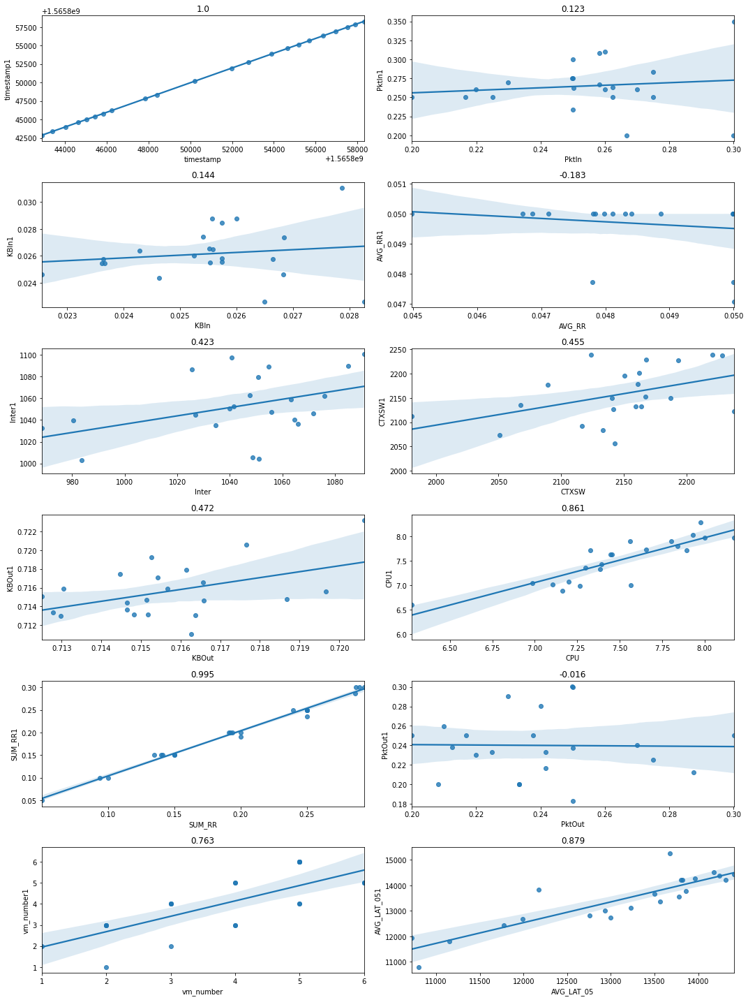

In [19]:
# Most nézzük meg, hogy milyen korreláció van az egyes before after változók között

fig, axes = plt.subplots(6, 2, figsize=(15, 20), sharey=False)
for j, i in enumerate(df.columns):
  corr = str(round(fd[i].corr(fd[i+'1']), 3))

  r = int(j/2)
  c = 1 if (j % 2 == 1) else 0
  sns.regplot(ax=axes[r, c], x = fd[i], y = fd[i+'1']).set_title(corr)

plt.tight_layout()
plt.show()


r2  =  0.7421338819040775
r2w =  0.7421338819040775


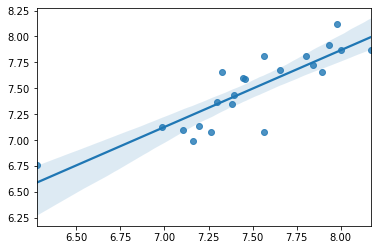

In [35]:
# Regresszió

y = fd['CPU'].values          # Current
x = fd['CPU1'].values         # Lag
x = x.reshape(-1,1)

regression = LinearRegression()

regression.fit(x,y)

y_pred = regression.predict(x)

r2  = r2_score(y, y_pred)
r2w = r2_score(y, y_pred, multioutput='variance_weighted')

print('r2  = ', r2)
print('r2w = ', r2w)

sns.regplot(y, y_pred)
plt.show()

In [21]:
fd.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051', 'difference',
       'abs_difference'],
      dtype='object')

r2_old  =  0.4311579715567606 	 r2w_old =  0.43115797155676067
r2_new  =  0.8029089922264502 	 r2w_new =  0.8029089922264502


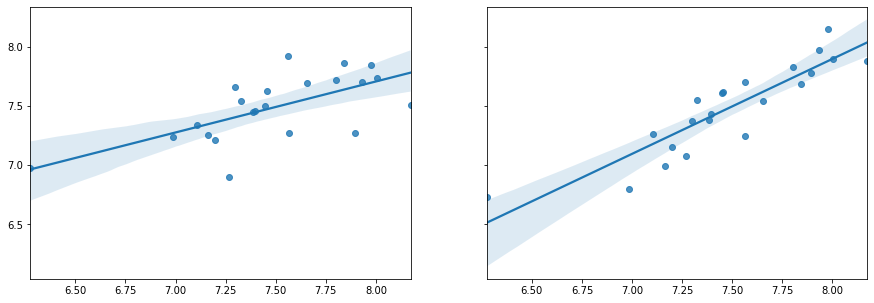

In [31]:
# Regresszió

y     = fd['CPU'].values          # Current
x_old = fd[[str(i+'1'), 'vm_number1']].values
x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051']].values

x_new = fd[['CPU1', 'PktIn1']].values

regression = LinearRegression()

# fit old
regression.fit(x_old, y)
y_pred_old = regression.predict(x_old)
r2_old  = r2_score(y, y_pred_old)
r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

# fit new
regression.fit(x_new, y)
y_pred_new = regression.predict(x_new)
r2_new  = r2_score(y, y_pred_new)
r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')


print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
sns.regplot(ax=axes[0], x = y, y = y_pred_old)
sns.regplot(ax=axes[1], x = y, y = y_pred_new)
plt.show()


timestamp
r2_old  =  0.999999222617348 	 r2w_old =  0.999999222617348
r2_lat  =  0.537649671822559 	 r2w_lat =  0.537649671822559
r2_new  =  0.6536190797671109 	 r2w_new =  0.6536190797671109


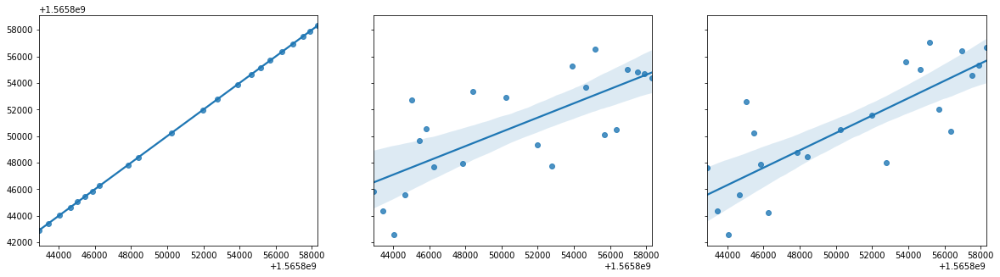

PktIn
r2_old  =  0.0175209910633789 	 r2w_old =  0.0175209910633789
r2_lat  =  0.6427113270628227 	 r2w_lat =  0.6427113270628229
r2_new  =  0.65425646463933 	 r2w_new =  0.65425646463933


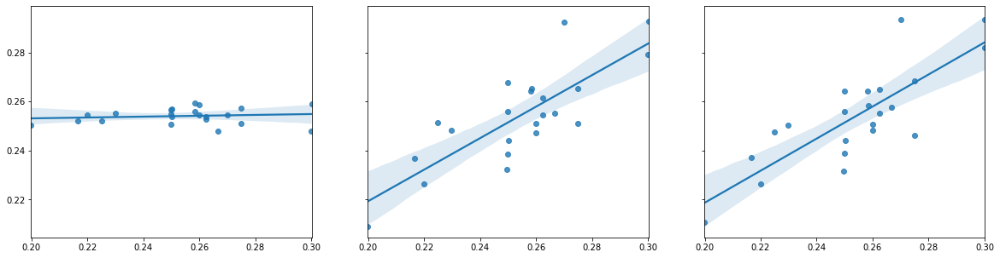

KBIn
r2_old  =  0.022354374347468564 	 r2w_old =  0.022354374347468564
r2_lat  =  0.587285128660435 	 r2w_lat =  0.587285128660435
r2_new  =  0.6179035428664268 	 r2w_new =  0.6179035428664268


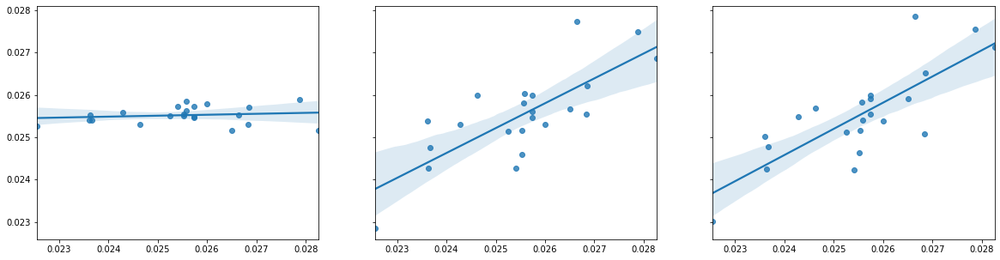

AVG_RR
r2_old  =  0.03340177052769566 	 r2w_old =  0.03340177052769566
r2_lat  =  0.22329215411384595 	 r2w_lat =  0.22329215411384595
r2_new  =  0.5552710033246258 	 r2w_new =  0.5552710033246258


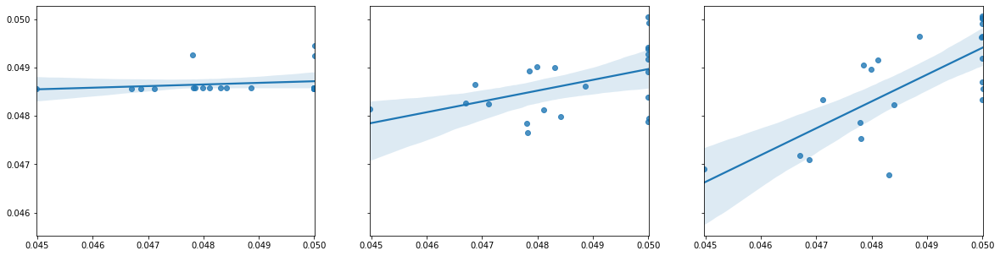

Inter
r2_old  =  0.40862376614840257 	 r2w_old =  0.40862376614840257
r2_lat  =  0.7401632192288584 	 r2w_lat =  0.7401632192288584
r2_new  =  0.7651220924772301 	 r2w_new =  0.7651220924772301


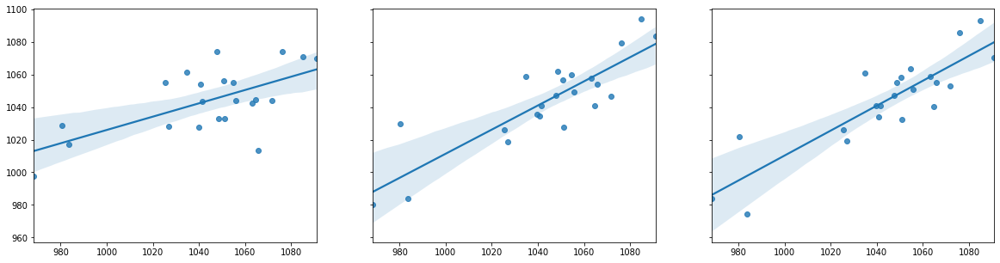

CTXSW
r2_old  =  0.3320211398755193 	 r2w_old =  0.3320211398755193
r2_lat  =  0.8632317409827879 	 r2w_lat =  0.8632317409827879
r2_new  =  0.8727942195274915 	 r2w_new =  0.8727942195274915


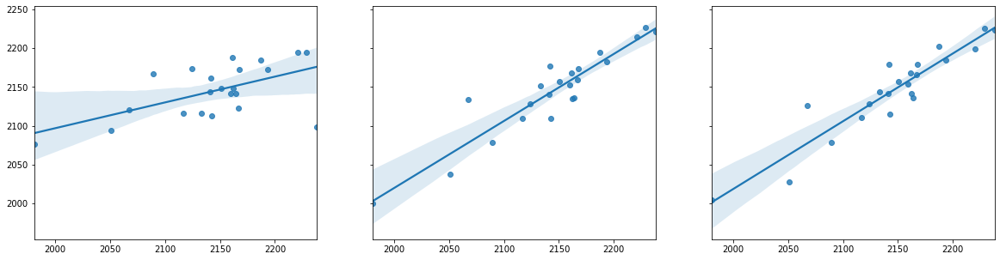

KBOut
r2_old  =  0.43142632599393427 	 r2w_old =  0.43142632599393427
r2_lat  =  0.6843383220345238 	 r2w_lat =  0.6843383220345238
r2_new  =  0.6880025151743773 	 r2w_new =  0.6880025151743773


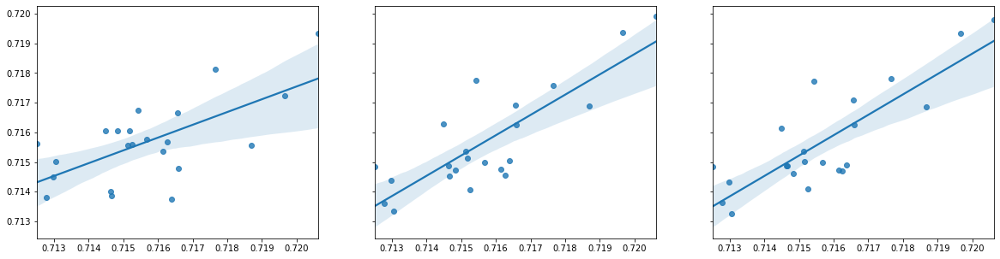

CPU
r2_old  =  0.754076860885141 	 r2w_old =  0.754076860885141
r2_lat  =  0.9155989660154187 	 r2w_lat =  0.9155989660154187
r2_new  =  0.9228124997348804 	 r2w_new =  0.9228124997348804


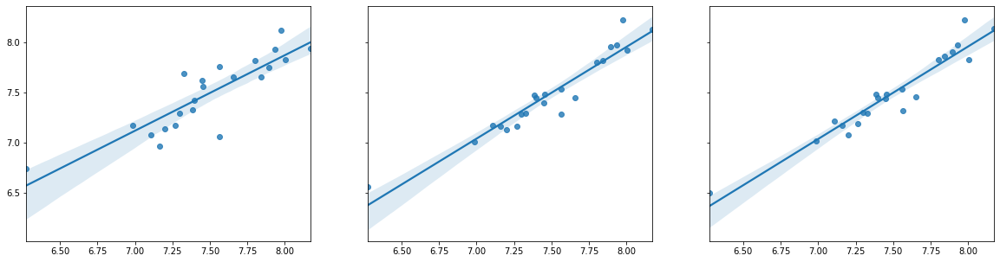

SUM_RR
r2_old  =  0.9946967641563618 	 r2w_old =  0.9946967641563618
r2_lat  =  0.9966485513739604 	 r2w_lat =  0.9966485513739605
r2_new  =  0.9979973623090623 	 r2w_new =  0.9979973623090623


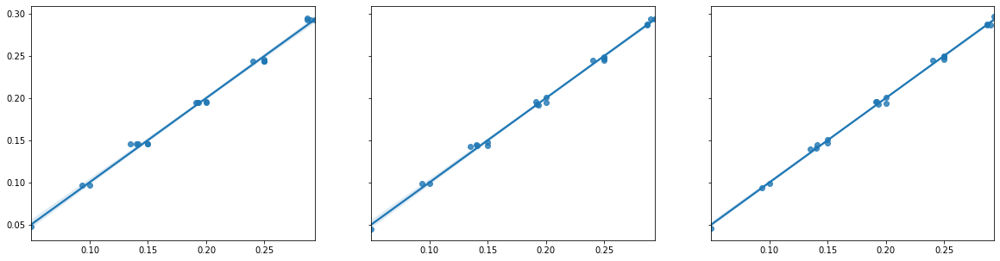

PktOut
r2_old  =  0.03996636303453671 	 r2w_old =  0.03996636303453671
r2_lat  =  0.5096467377189806 	 r2w_lat =  0.5096467377189806
r2_new  =  0.510755567121127 	 r2w_new =  0.510755567121127


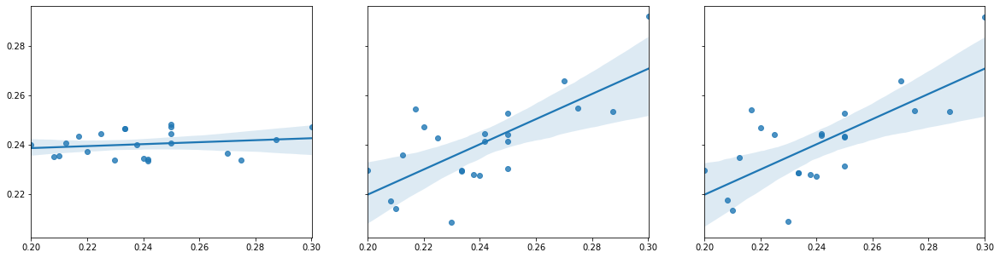

vm_number
r2_old  =  0.5822697122209317 	 r2w_old =  0.5822697122209317
r2_lat  =  0.7332207310255168 	 r2w_lat =  0.7332207310255168
r2_new  =  0.802793168382002 	 r2w_new =  0.802793168382002


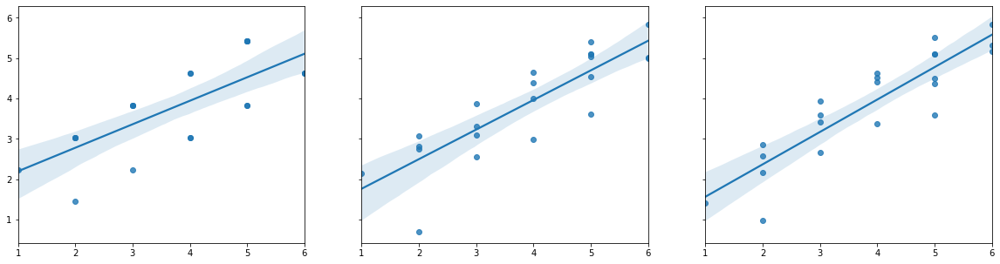

AVG_LAT_05
r2_old  =  0.7781064064564363 	 r2w_old =  0.7781064064564363
r2_lat  =  0.6257576570545127 	 r2w_lat =  0.6257576570545126
r2_new  =  0.8989162222467204 	 r2w_new =  0.8989162222467204


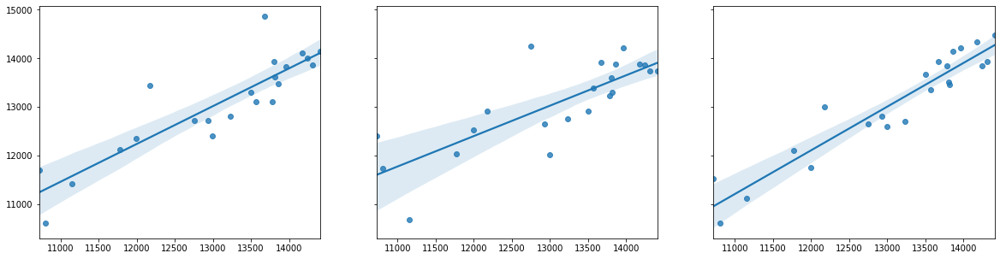

In [32]:
# Regresszió
for i in df.columns:
  y     = fd[i].values               # Current
  x_old = fd[[str( i + '1' ), 'vm_number1']].values
  x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051']].values
  x_lat = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1']].values


  regression = LinearRegression()

  # fit old
  regression.fit(x_old, y)
  y_pred_old = regression.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)
  r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

  # fit new
  regression.fit(x_new, y)
  y_pred_new = regression.predict(x_new)
  r2_new  = r2_score(y, y_pred_new)
  r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')

  # fit without latency
  regression.fit(x_lat, y)
  y_pred_lat = regression.predict(x_lat)
  r2_lat  = r2_score(y, y_pred_lat)
  r2w_lat = r2_score(y, y_pred_lat, multioutput='variance_weighted')



  print(i)
  print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
  print('r2_lat  = ', r2_lat, '\t', 'r2w_lat = ', r2w_lat)
  print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


  fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_lat)
  sns.regplot(ax=axes[2], x = y, y = y_pred_new)
  # plt.savefig('before_after.png')
  plt.show()
  


In [24]:
# NN, a request rate nélkül

In [25]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [26]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

X = df[columns].values
y = df['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(4,),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.7648558414830858
r2 test  =  0.6368623366293314


In [43]:
save_mlp('1_model.sav')

In [45]:
mlp = load_mlp('1_model.sav')

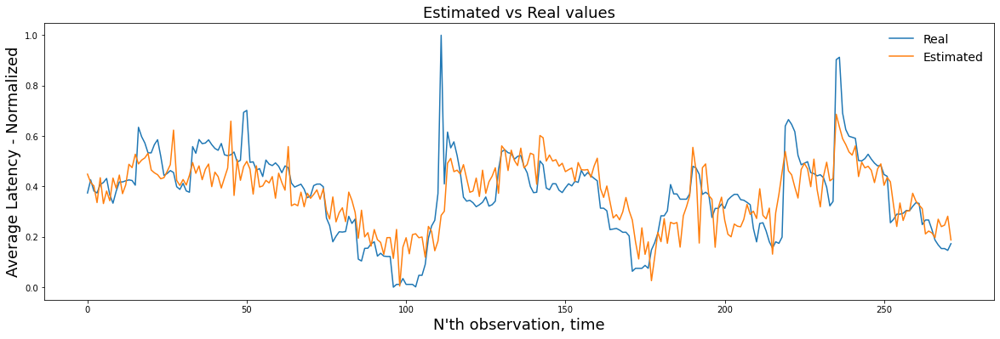

In [46]:
timeline_plot(y_train, y_pred_train)

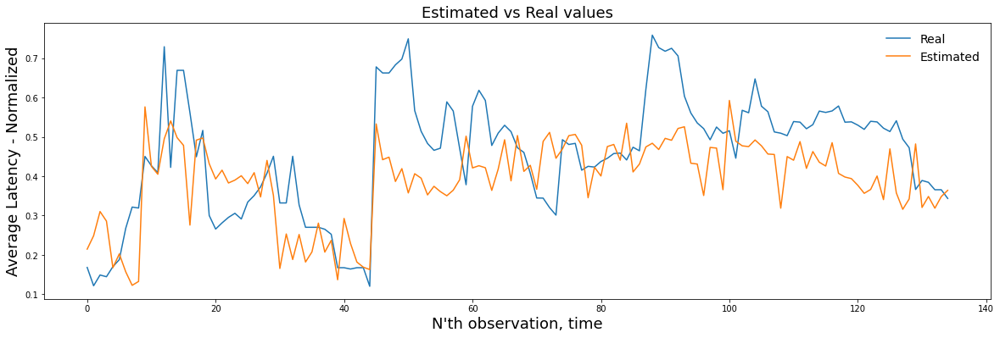

In [33]:
timeline_plot(y_test, y_pred_test)

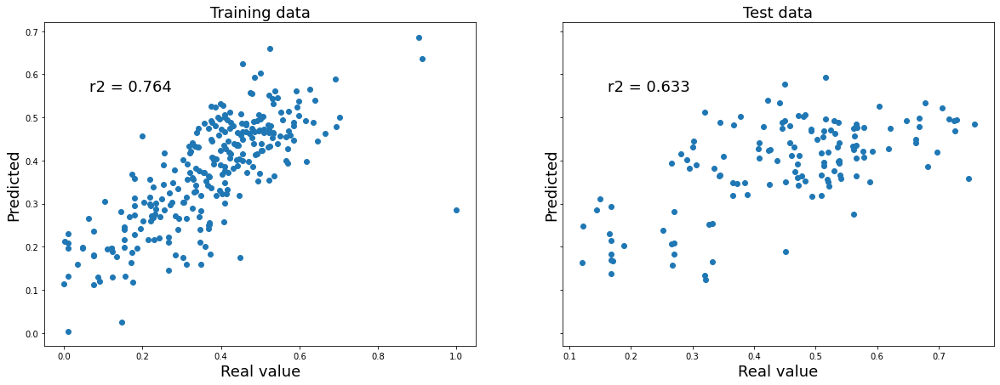

In [34]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

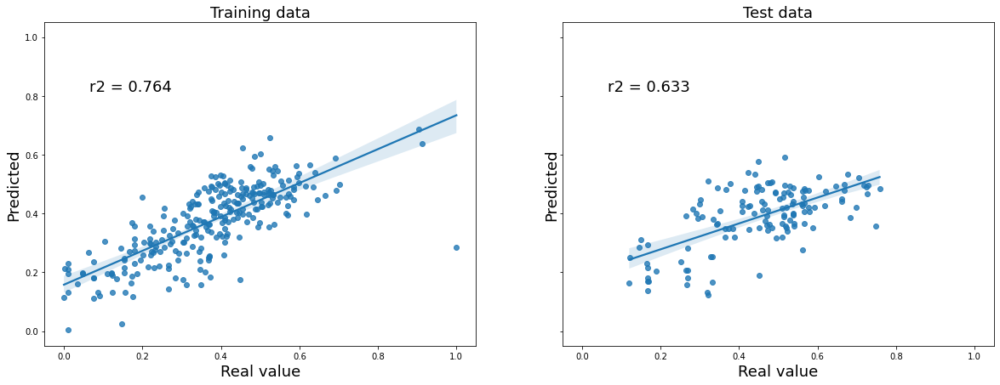

In [35]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

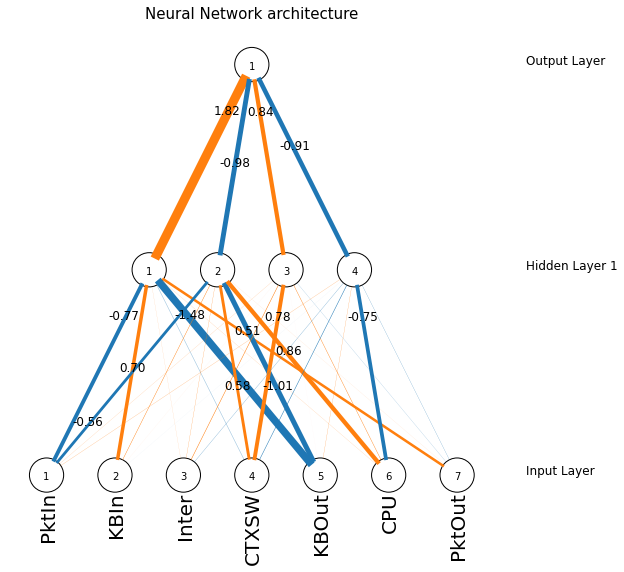

In [47]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [48]:
# NN request rate nélkül laggal

In [49]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [50]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=4,
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8072445874807793
r2 test  =  0.6426889375415011


In [54]:
model = '2_model.sav'
if (load == True):
  mlp = load_mplp(model)
else:
  save_mlp(model)

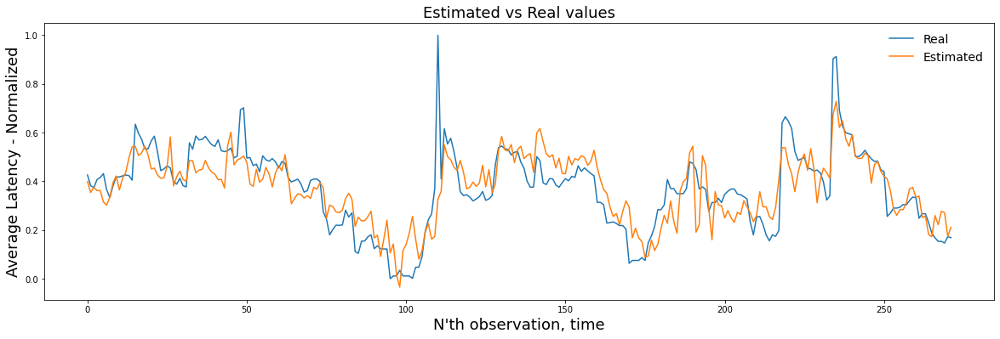

In [55]:
timeline_plot(y_train, y_pred_train)

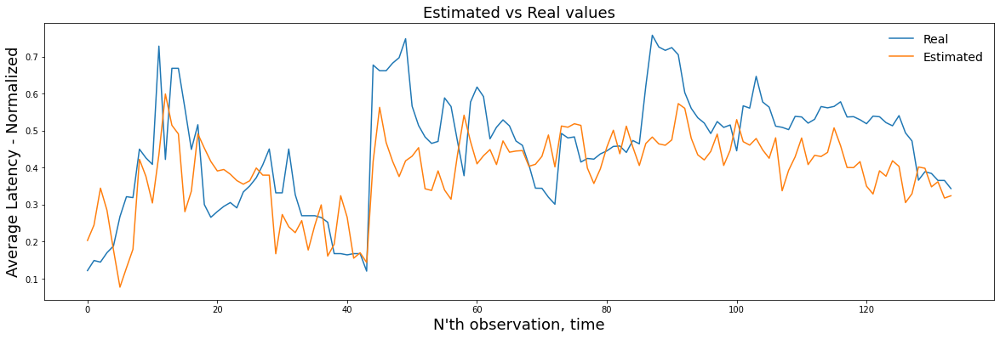

In [56]:
timeline_plot(y_test, y_pred_test)

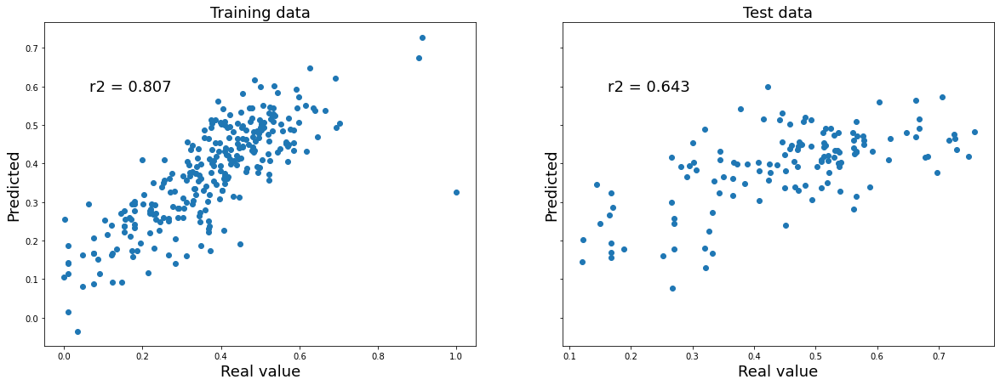

In [57]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

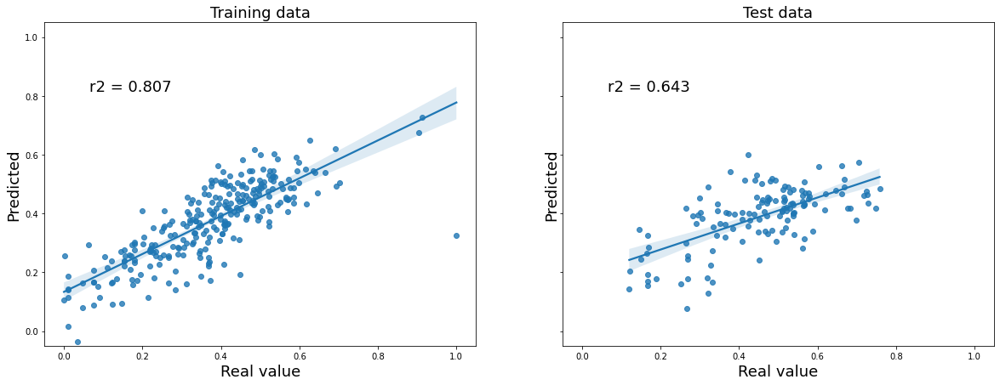

In [58]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

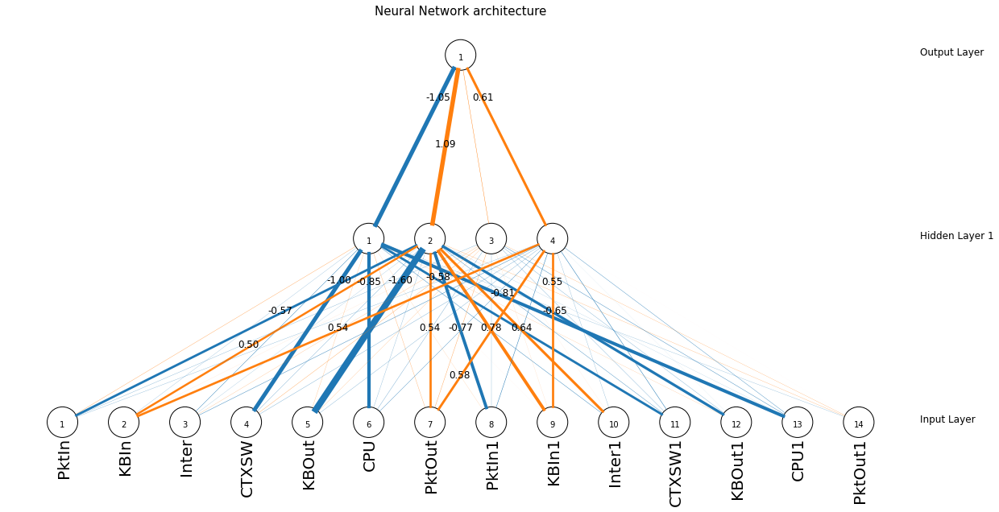

In [59]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [60]:
# NN request rate nélkül laggal összetettem neurális hálóval

In [61]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [62]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8560525528487342
r2 test  =  0.6479864451260952


In [63]:
model = '3_model.sav'
if (load == True):
  mlp = load_mplp(model)
else:
  save_mlp(model)

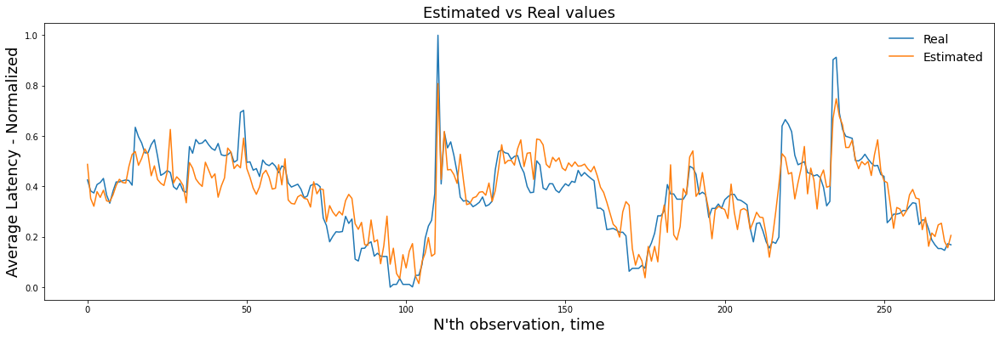

In [64]:
timeline_plot(y_train, y_pred_train)

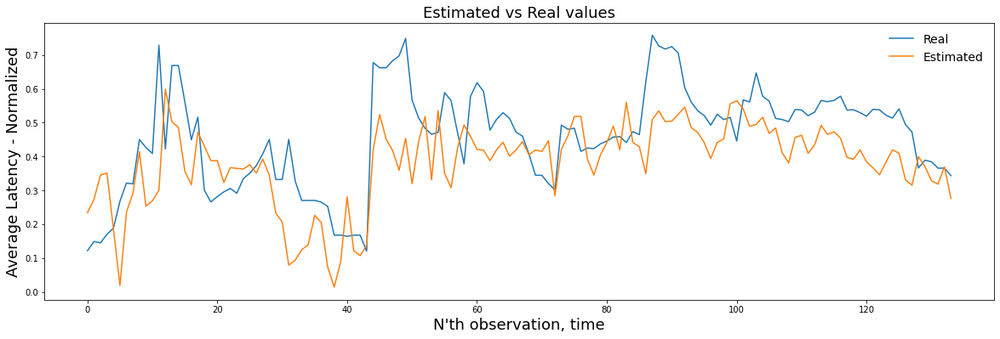

In [65]:
timeline_plot(y_test, y_pred_test)

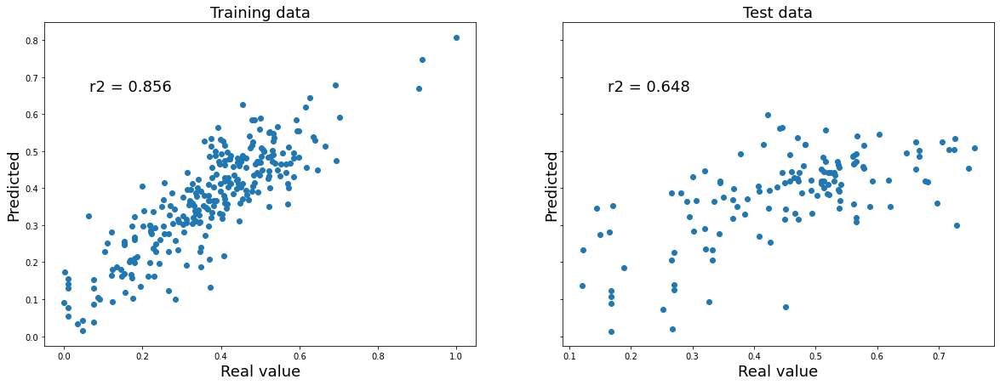

In [66]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

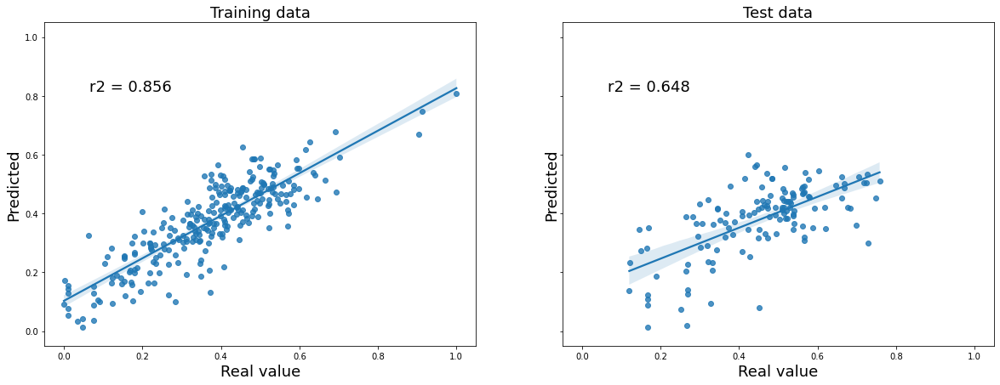

In [67]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

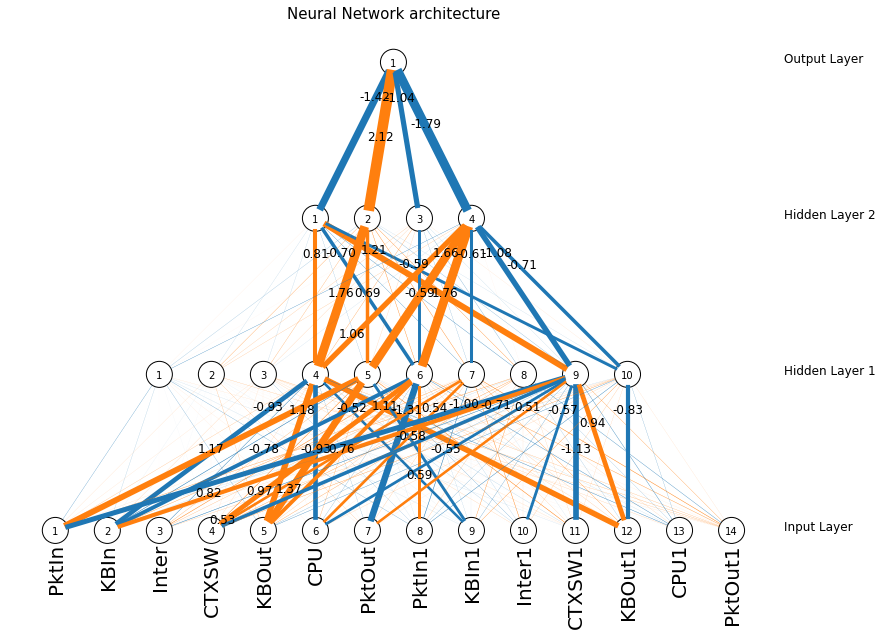

In [68]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [69]:
# NN, lag nélkül és laggal

In [70]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [71]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

X = df[columns].values
y = df['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8701441728634379
r2 test  =  0.5830658711085674


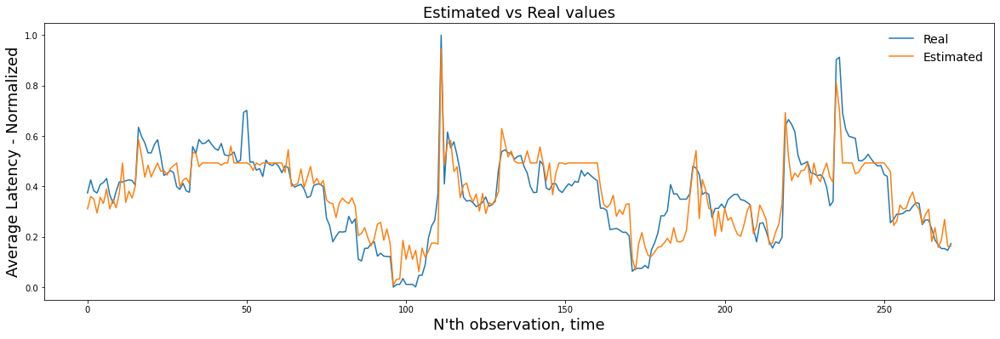

In [72]:
timeline_plot(y_train, y_pred_train)

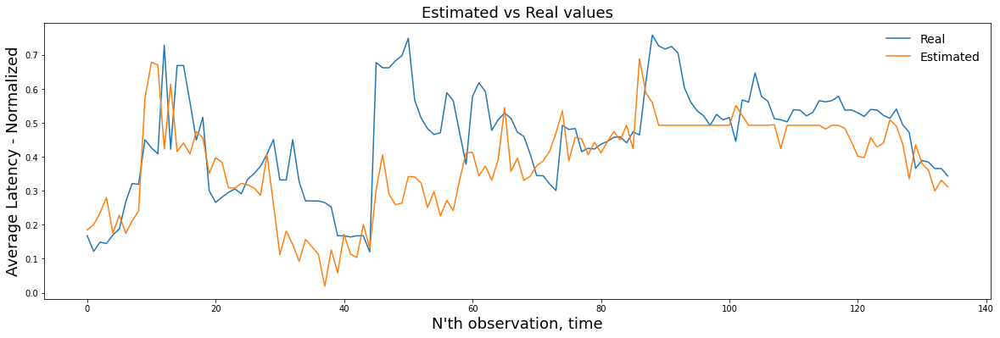

In [73]:
timeline_plot(y_test, y_pred_test)

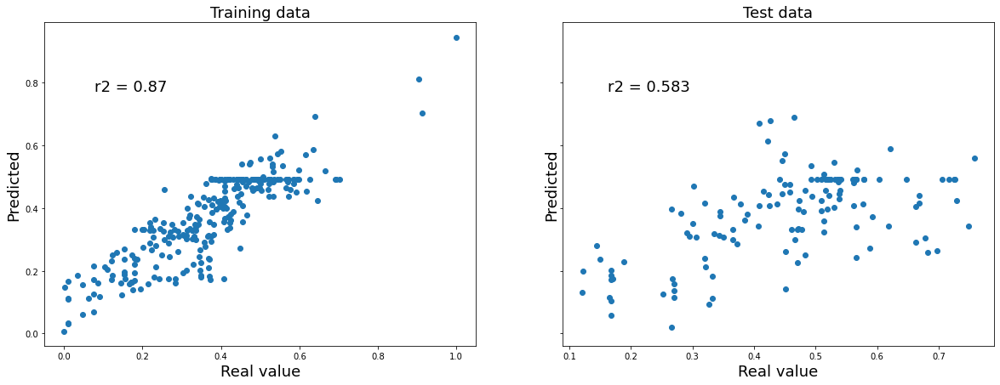

In [74]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

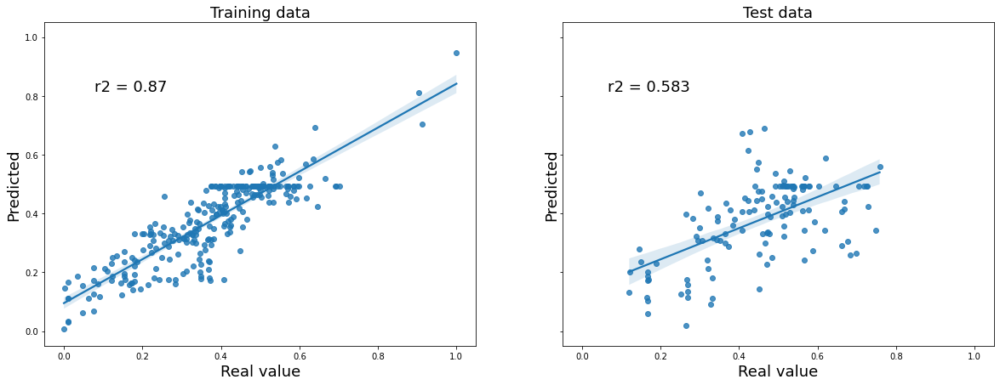

In [75]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

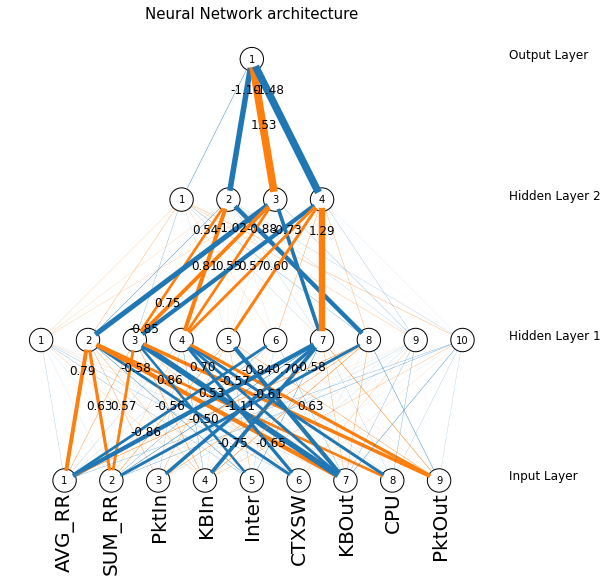

In [76]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [77]:
# NN laggal

In [78]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [79]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=4,
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8216792810035435
r2 test  =  0.6396158213829503


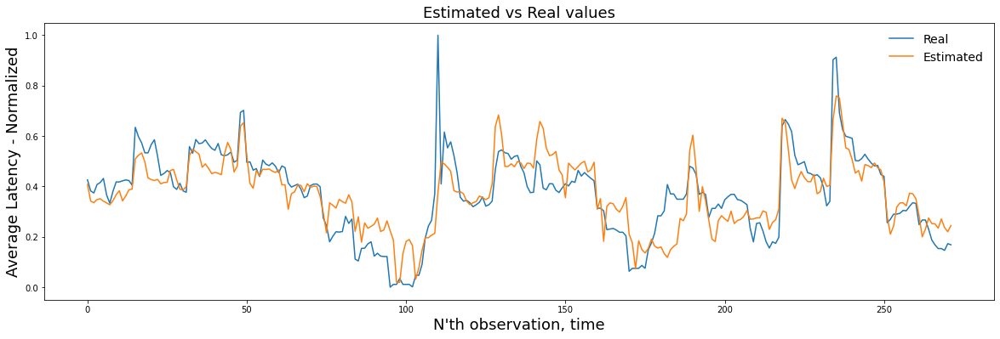

In [80]:
timeline_plot(y_train, y_pred_train)

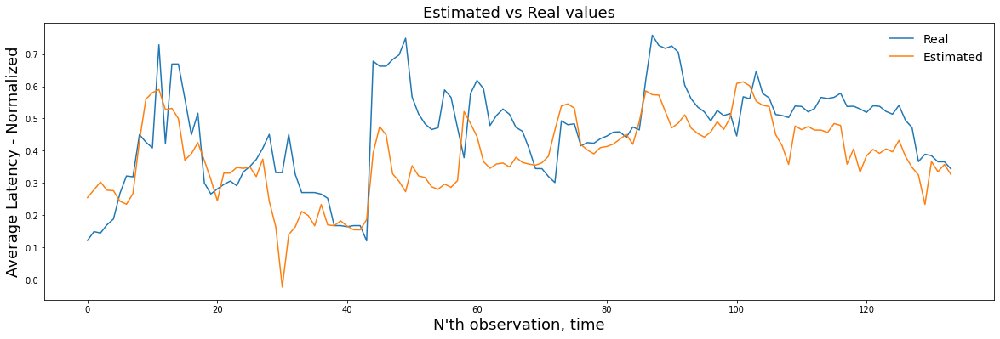

In [81]:
timeline_plot(y_test, y_pred_test)

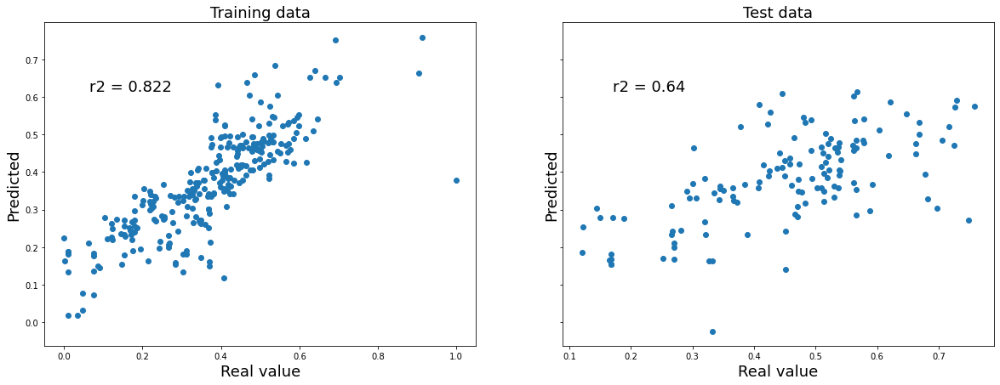

In [82]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

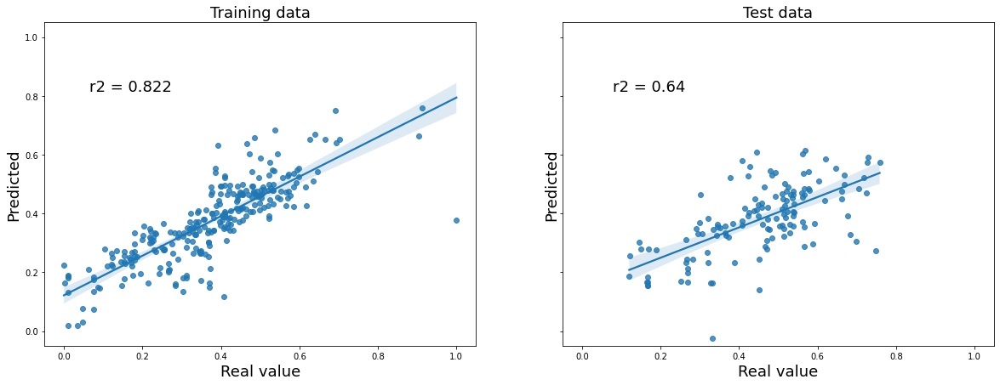

In [83]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

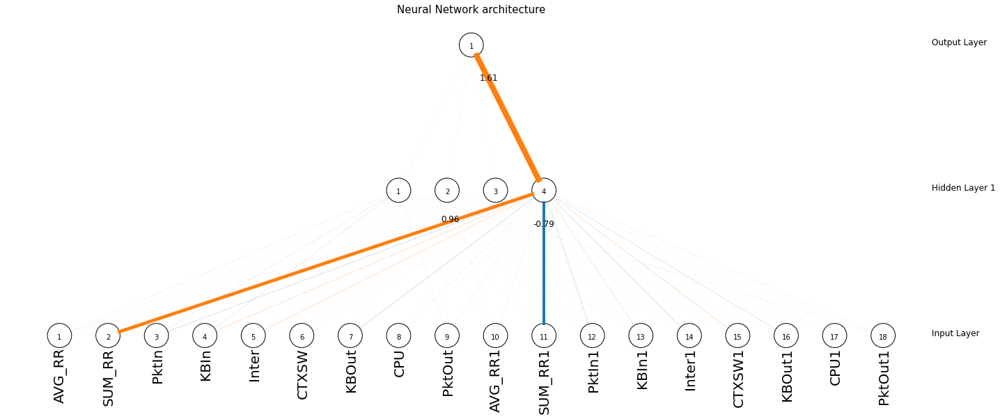

In [84]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [87]:
# kumulatív hiba számolásával

In [88]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]


  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9041675333260989
step =  200 	 r2 =  0.8899558323004514
step =  250 	 r2 =  0.9118401677685763
step =  300 	 r2 =  0.9037248160074667
step =  350 	 r2 =  0.8777538607384336
step =  400 	 r2 =  0.8693154807356409


[29.9949005]


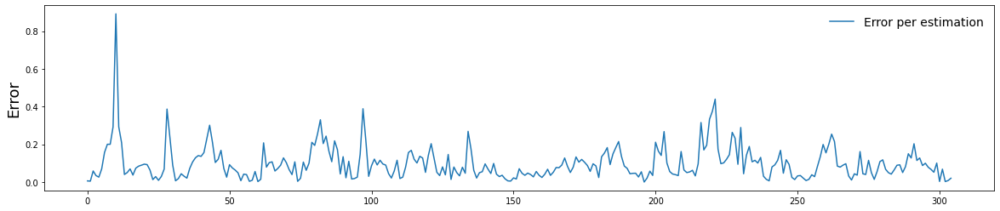

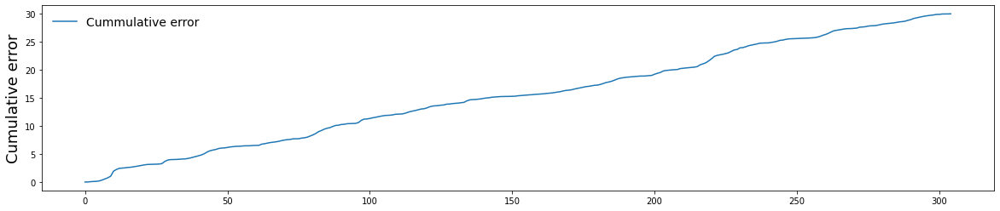

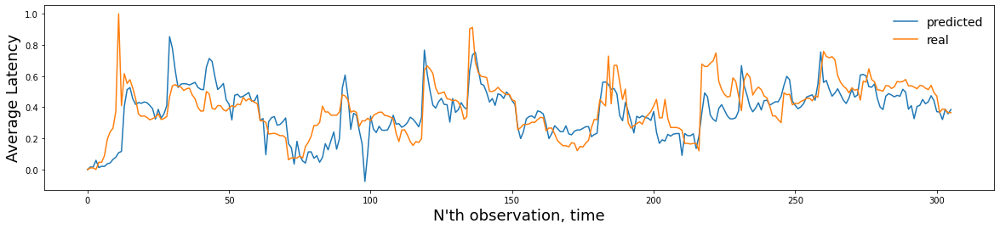

In [89]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [90]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8670998767069161

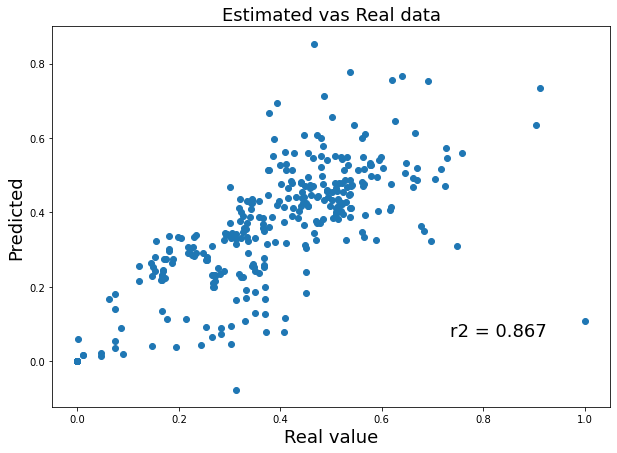

In [91]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

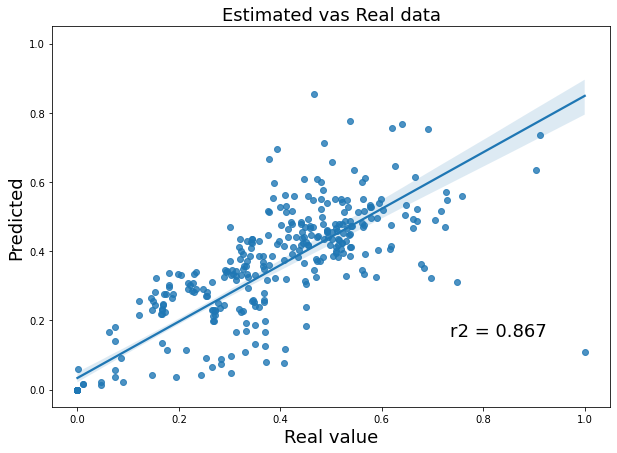

In [92]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [93]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]


  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9041675333260989
step =  200 	 r2 =  0.8899558323004514
step =  250 	 r2 =  0.9118401677685763
step =  300 	 r2 =  0.9037248160074667
step =  350 	 r2 =  0.8777538607384336
step =  400 	 r2 =  0.8693154807356409


[29.9949005]


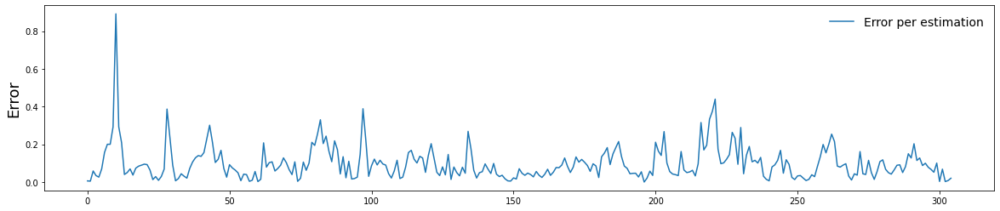

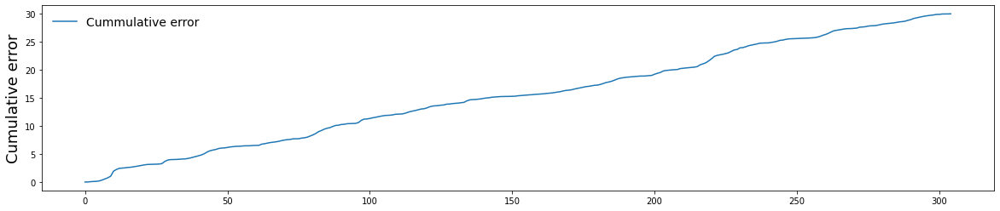

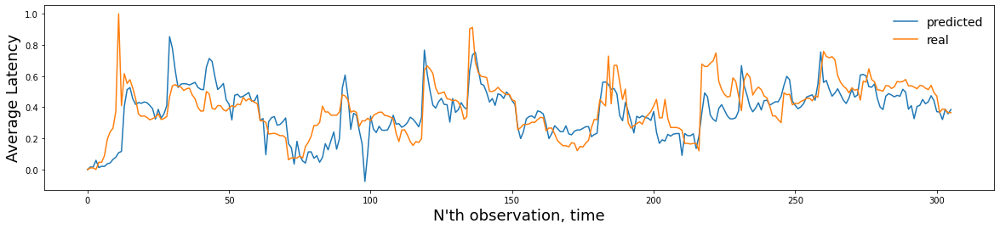

In [94]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [95]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8670998767069161

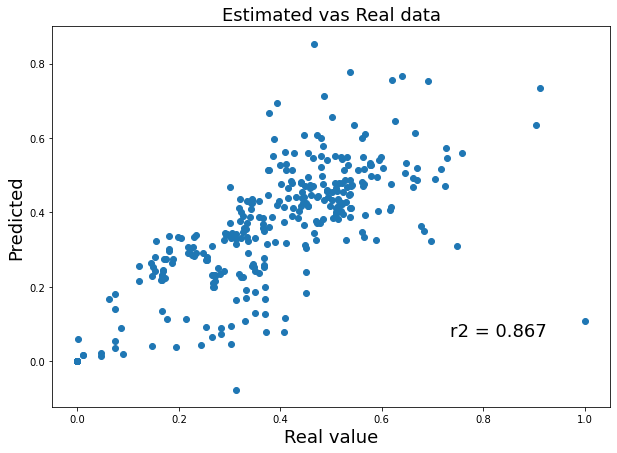

In [96]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

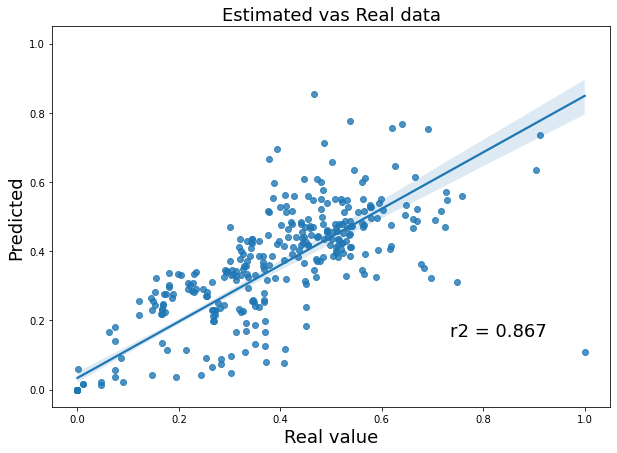

In [97]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [98]:
# lagok nélküli futó hiba

In [99]:
X = ba[['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9048521783207849
step =  200 	 r2 =  0.8795812469408681
step =  250 	 r2 =  0.8987421744904915
step =  300 	 r2 =  0.8876996195311588
step =  350 	 r2 =  0.8560715091644007
step =  400 	 r2 =  0.8506940387857679


[30.28859043]


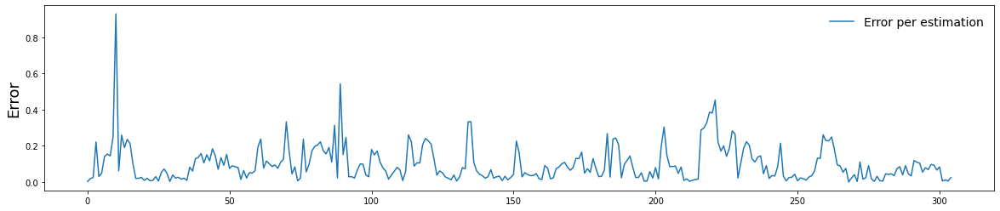

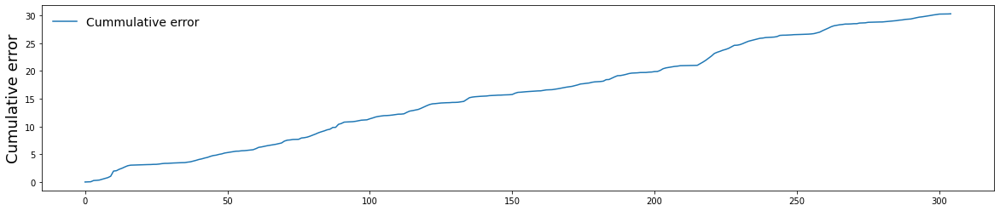

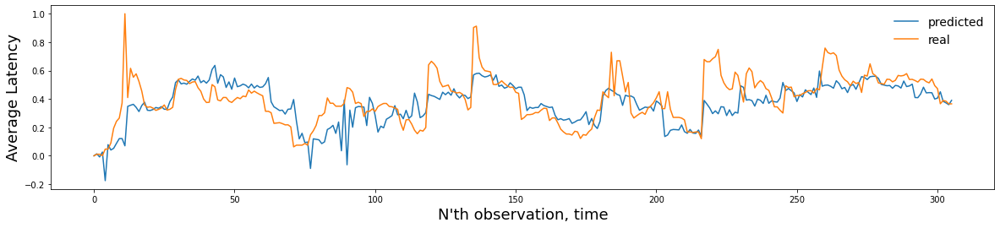

In [100]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [101]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8481080573164094

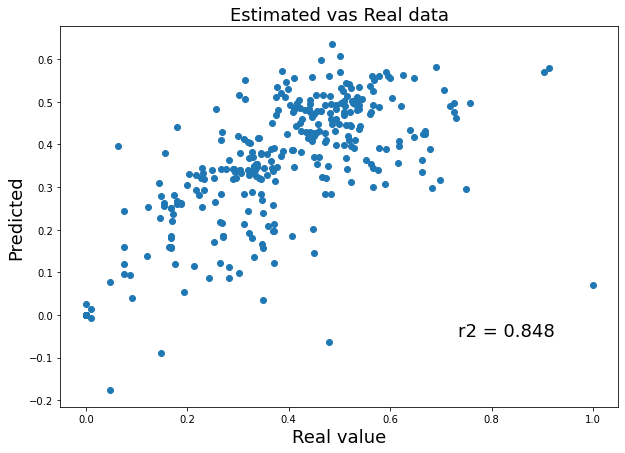

In [102]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

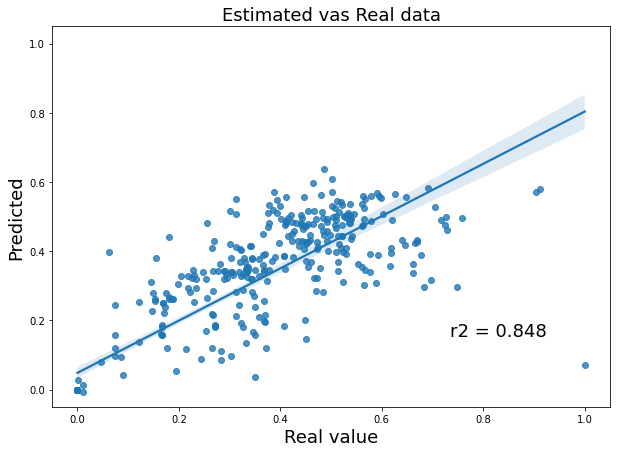

In [103]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [104]:
# lagok nélküli futó hiba összetetteb hálóval

In [105]:
X = ba[['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=10,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.8881609077597915
step =  200 	 r2 =  0.8363770382010134
step =  250 	 r2 =  0.8635651806698671
step =  300 	 r2 =  0.8537319682444819
step =  350 	 r2 =  0.8237539289932801
step =  400 	 r2 =  0.8141244884700531


[33.73870233]


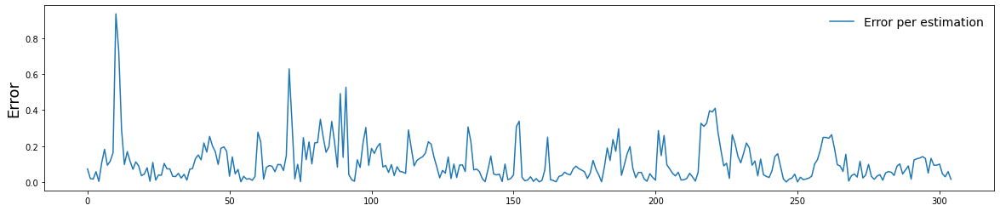

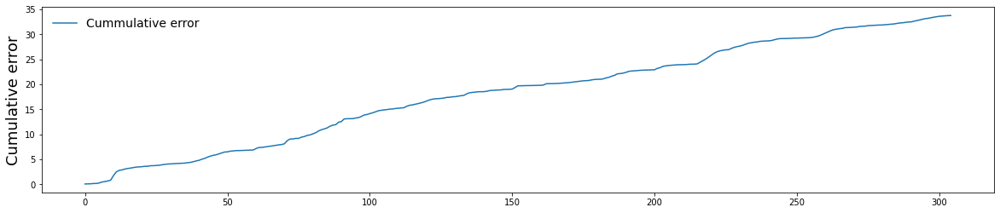

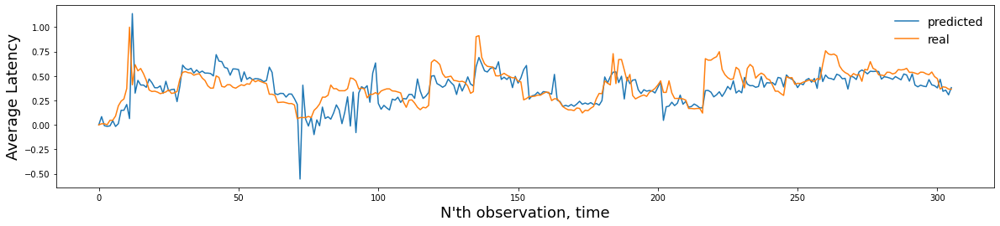

In [106]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [107]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8111502880973274

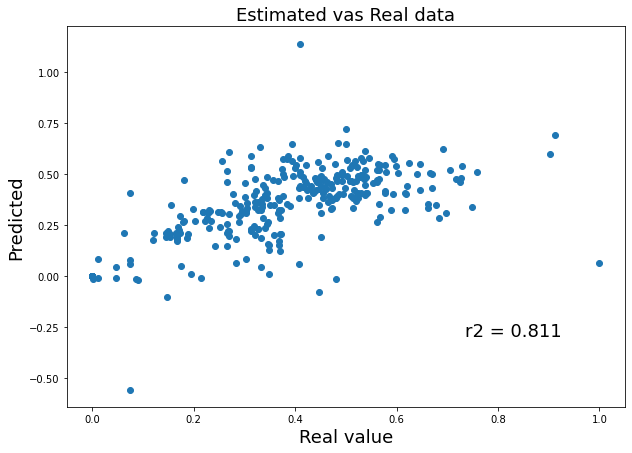

In [108]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

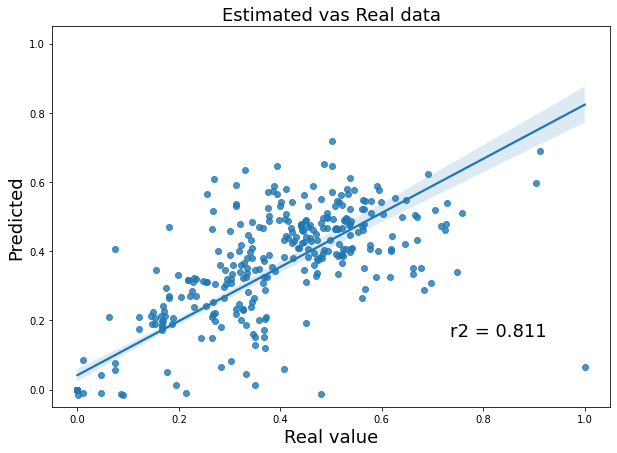

In [109]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)


<a name="play_ground"></a>

# Playground

Itt ki lehet próbálni mindeféle beállítást, és ha találok valami érdkeset akkor azt tovább lehet gondolni

[Vissza](#tartalom)<br>


In [110]:
playground_cumulative_errors = []

In [111]:
def playground_plots(playground_cumulative_errors=None):
  if(len(playground_cumulative_errors) > 0):
    plt.figure(figsize=(20,6))
    for i in playground_cumulative_errors:
      plt.plot(i[2], label = str(i[0]))
      plt.ylabel('Cumulative error', fontsize=18)
      plt.legend(fontsize=14, frameon=False)
    plt.show()


In [112]:
# NN laggal

In [113]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [114]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=1000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.9458853950642023
r2 test  =  0.5236547775163586


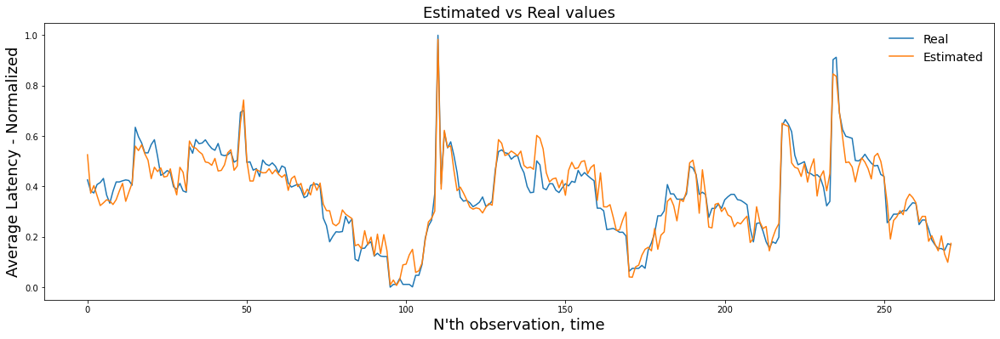

In [115]:
timeline_plot(y_train, y_pred_train)

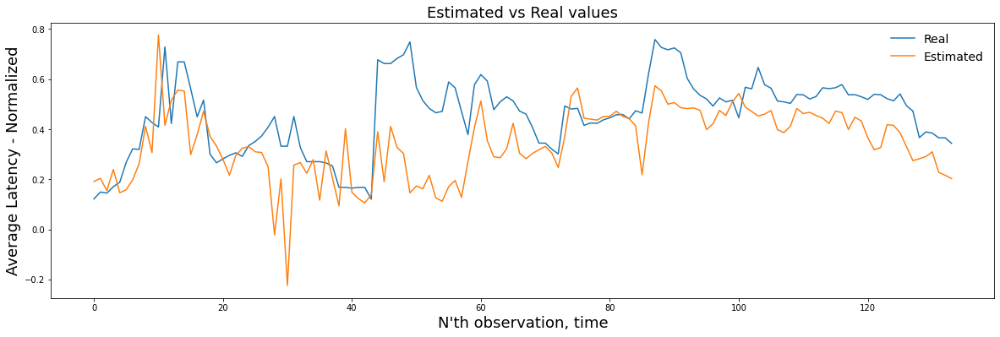

In [116]:
timeline_plot(y_test, y_pred_test)

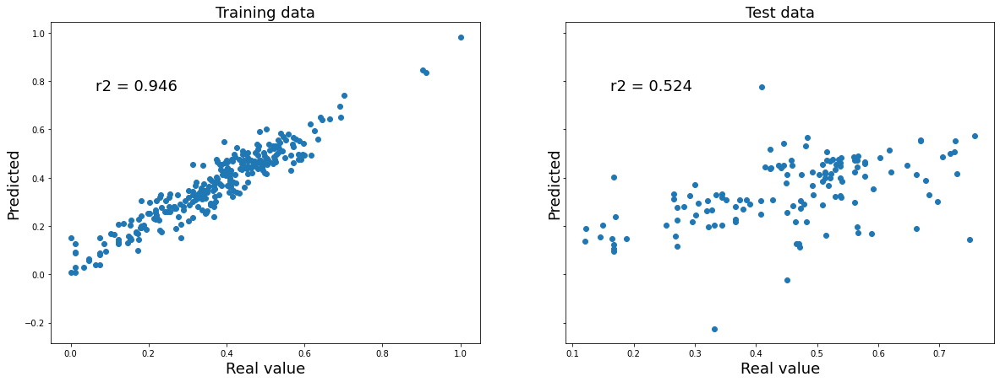

In [117]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

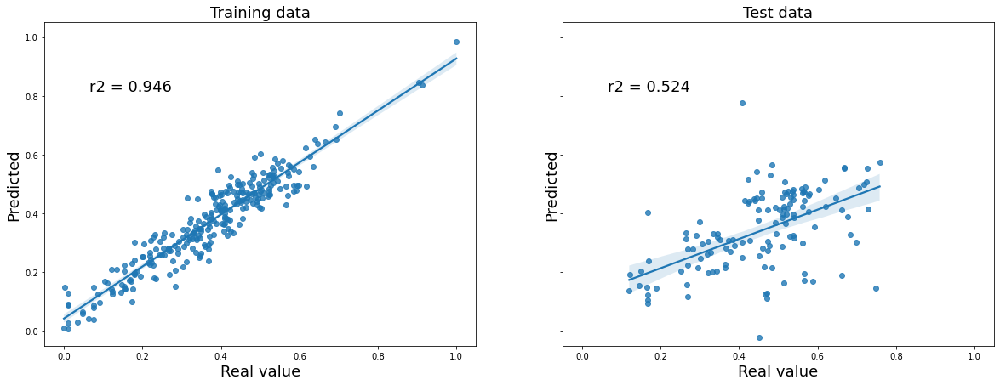

In [118]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

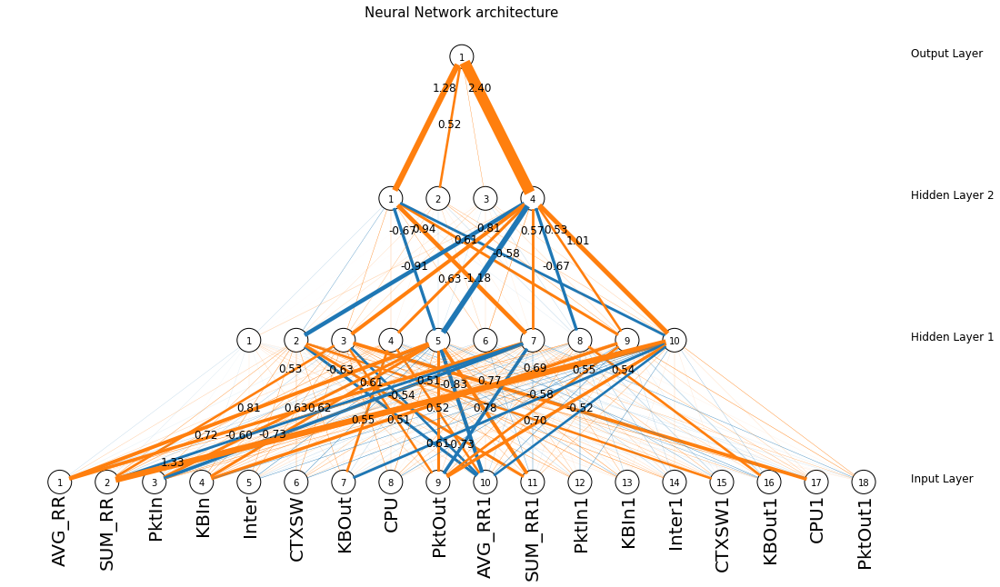

In [119]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [120]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=i,
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'elso'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9082273369553053
step =  200 	 r2 =  0.8811580645078659
step =  250 	 r2 =  0.8917045093373713
step =  300 	 r2 =  0.8820351543218241
step =  350 	 r2 =  0.8473197185588789
step =  400 	 r2 =  0.8405397130385728


[31.71988592]


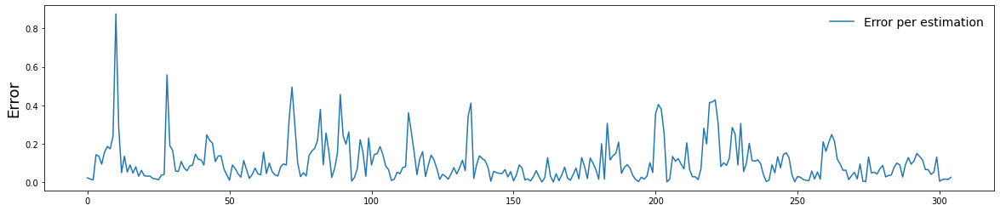

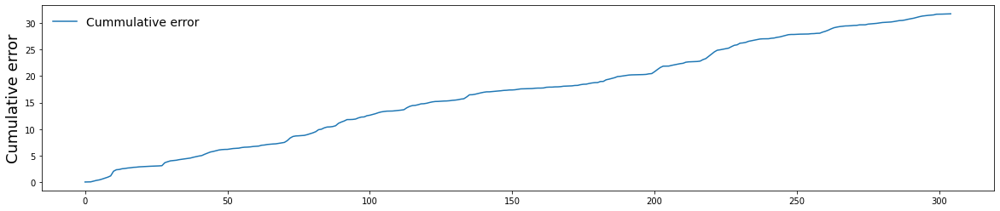

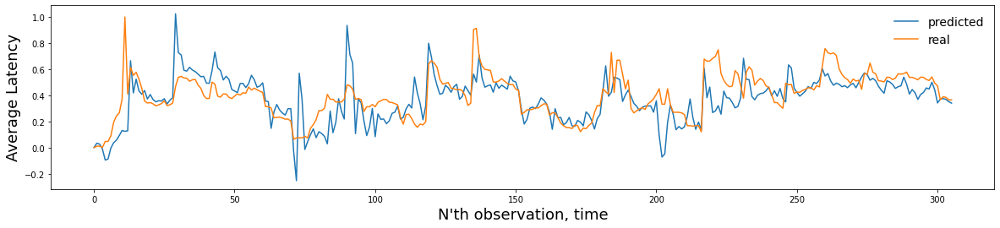

In [121]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

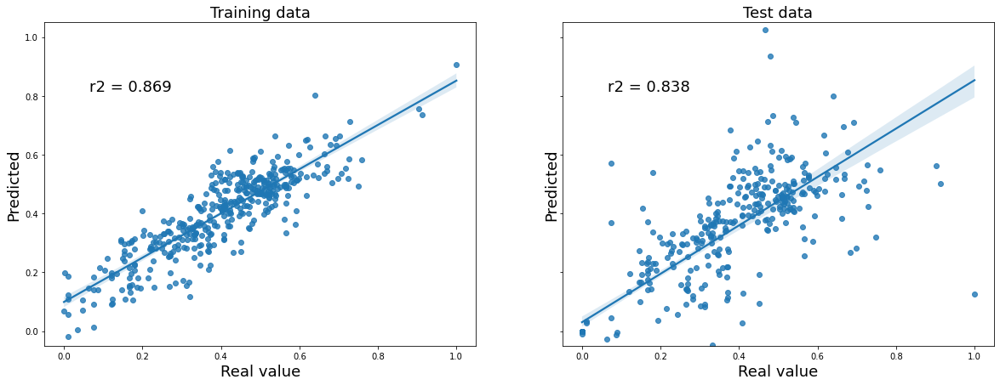

In [122]:
train_test_real_predicted_scatter_sns(y_train, y_real, y_pred_train, y_predicted)

In [123]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=500,
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'masoidk'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -1.0
step =  150 	 r2 =  0.9107188667275079
step =  200 	 r2 =  0.8372210088632973
step =  250 	 r2 =  0.8515492937477377
step =  300 	 r2 =  0.843055566143412
step =  350 	 r2 =  0.8077749454848494
step =  400 	 r2 =  0.7996187330574426


[33.54278507]


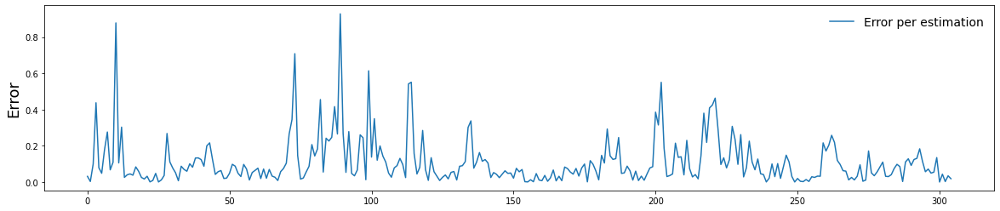

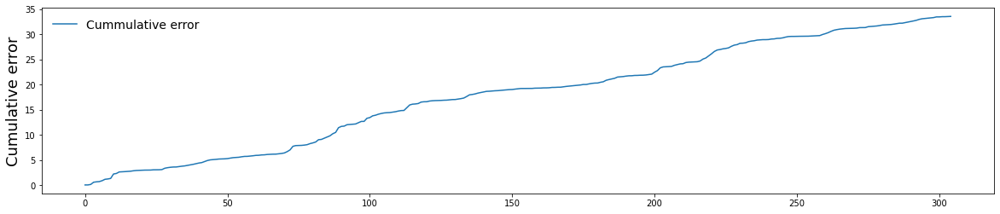

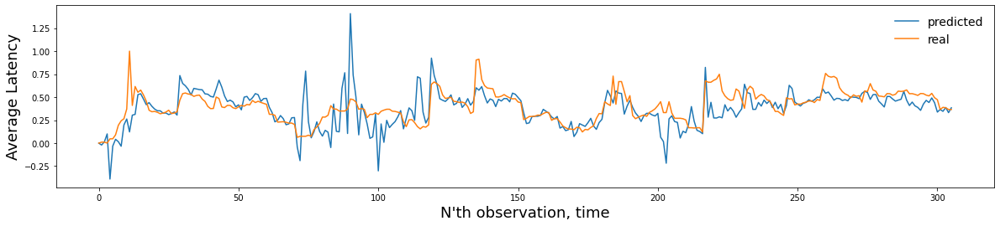

In [124]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

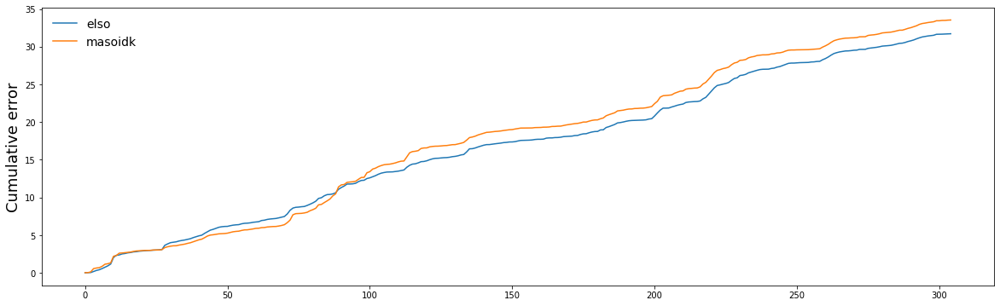

In [125]:
playground_plots(playground_cumulative_errors)

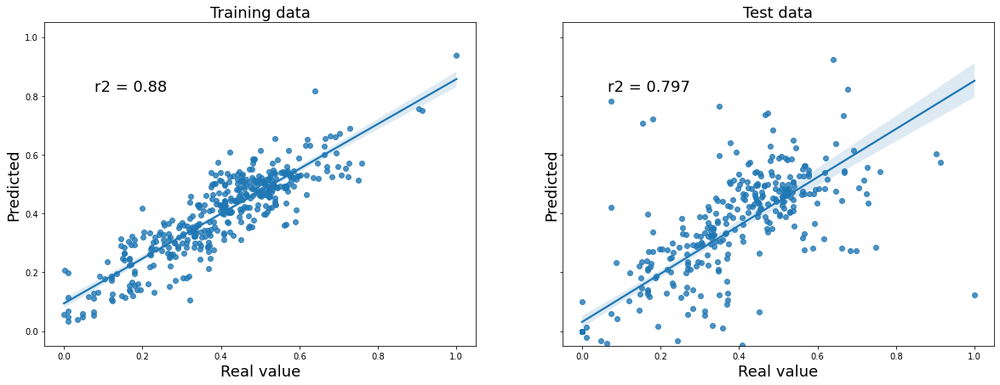

In [126]:
train_test_real_predicted_scatter_sns(y_train, y_real, y_pred_train, y_predicted)

In [127]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=int(i/3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'harmadik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.875571474732233
step =  200 	 r2 =  0.8679372772776998
step =  250 	 r2 =  0.8948649667359291
step =  300 	 r2 =  0.8886391237771593
step =  350 	 r2 =  0.8585833158744904
step =  400 	 r2 =  0.8535157523006698


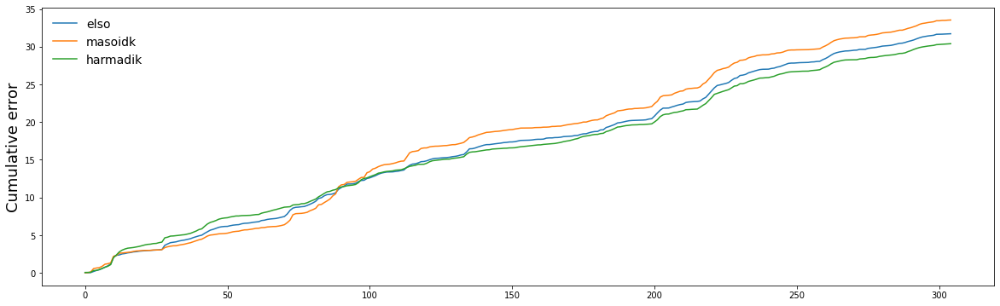

In [128]:
playground_plots(playground_cumulative_errors)

In [129]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i/3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.1,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'negyedik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -0.9999999999999901
step =  150 	 r2 =  0.9099000470572457
step =  200 	 r2 =  0.8993058978701706
step =  250 	 r2 =  0.9197524327010987
step =  300 	 r2 =  0.9126820969530538
step =  350 	 r2 =  0.8733560763178666
step =  400 	 r2 =  0.8685274407912124


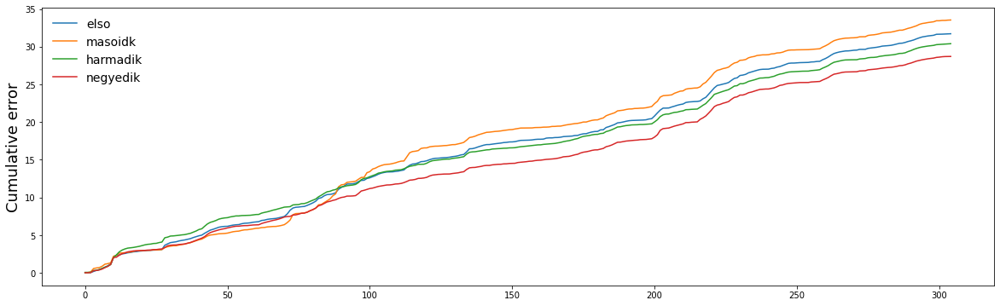

In [130]:
playground_plots(playground_cumulative_errors)

In [131]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[i-10:i,:]
  y_train = y_scaled[i-10:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i*3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.099,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.09,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'ötödik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9127428634918163
step =  200 	 r2 =  0.9162471138684741
step =  250 	 r2 =  0.9209960298569078
step =  300 	 r2 =  0.8703448335341558
step =  350 	 r2 =  0.8585868327650383
step =  400 	 r2 =  0.8531477991990808


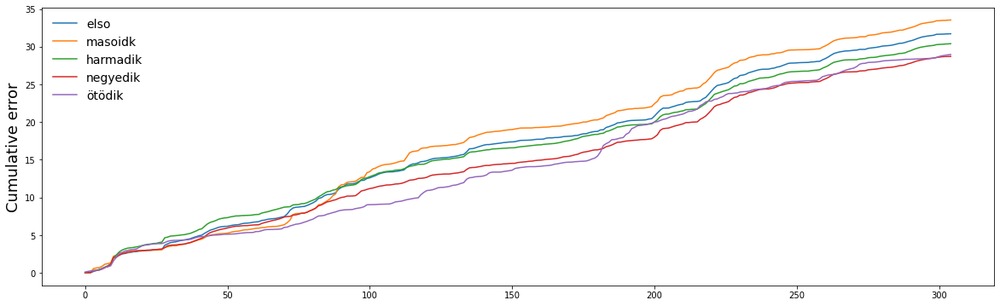

In [132]:
playground_plots(playground_cumulative_errors)

[28.96315652]


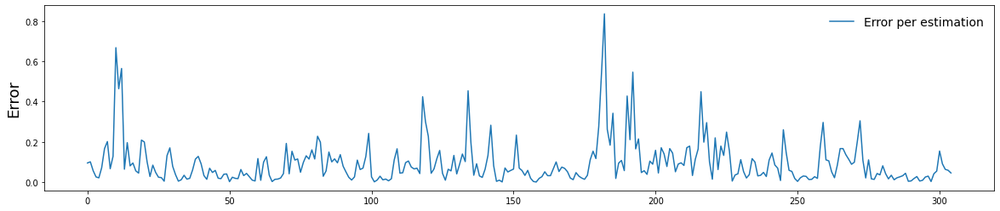

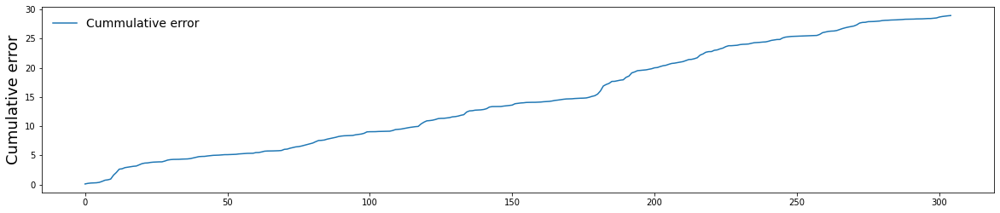

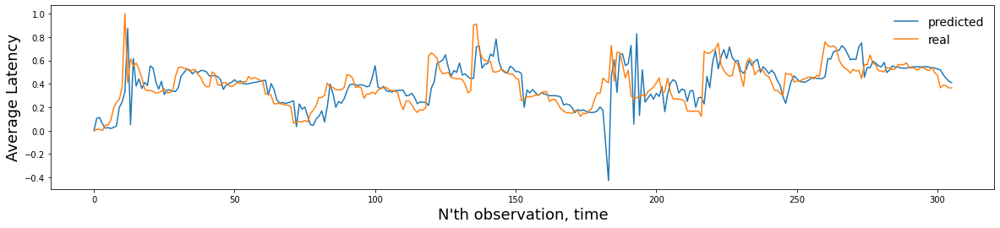

In [133]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

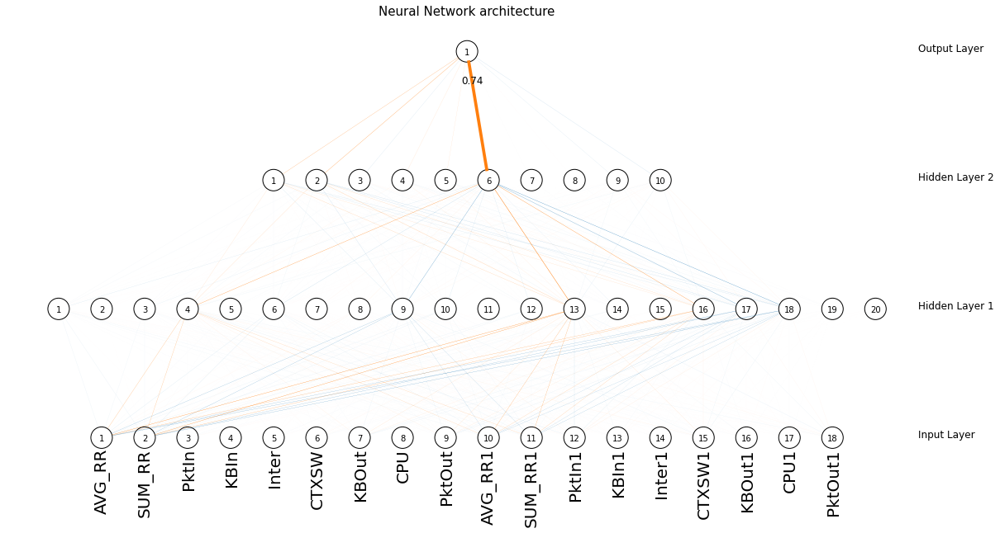

In [134]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [135]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[i-100:i,:]
  y_train = y_scaled[i-100:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i*3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.099,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.09,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'hatodik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -0.9999999999999921
step =  150 	 r2 =  0.9055215709109512
step =  200 	 r2 =  0.7645556849896056
step =  250 	 r2 =  0.7870927432972723
step =  300 	 r2 =  0.7658959006375845
step =  350 	 r2 =  0.7272607057379046
step =  400 	 r2 =  0.7270606921084937


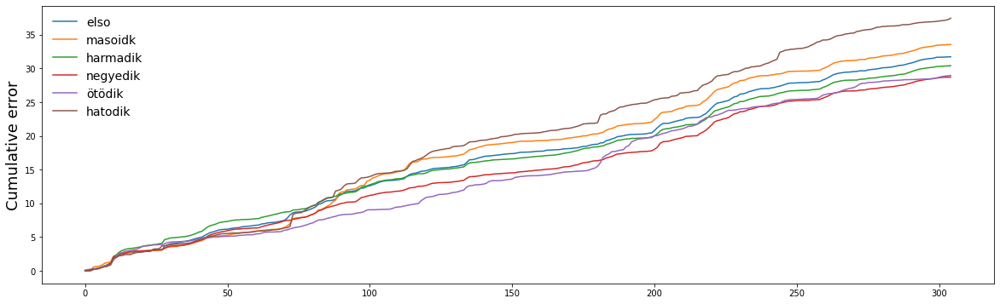

In [136]:
playground_plots(playground_cumulative_errors)

[37.42798877]


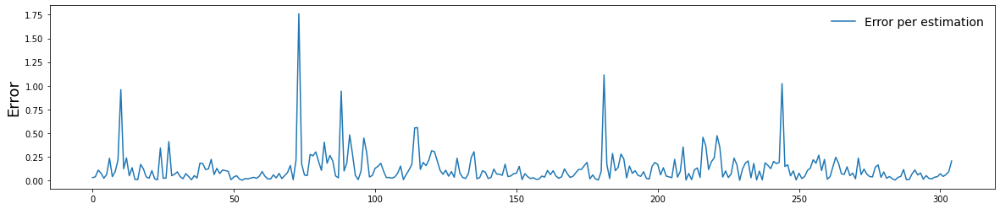

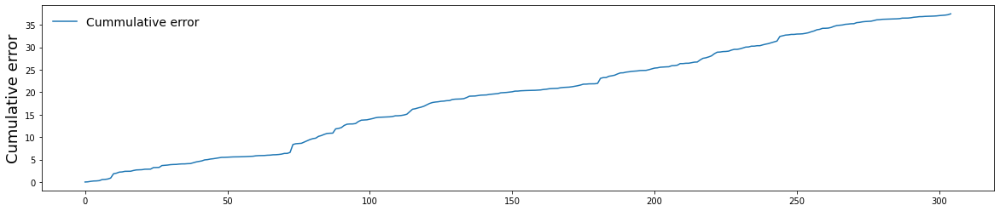

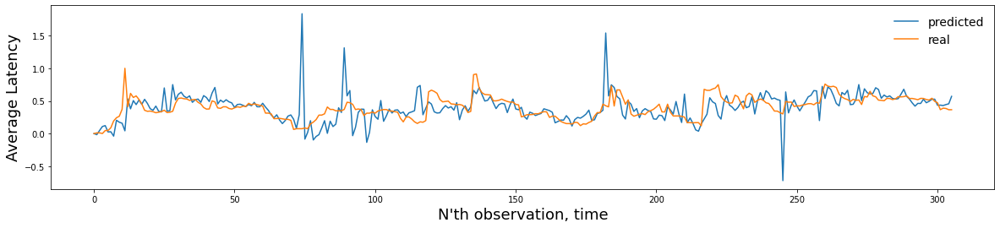

In [137]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

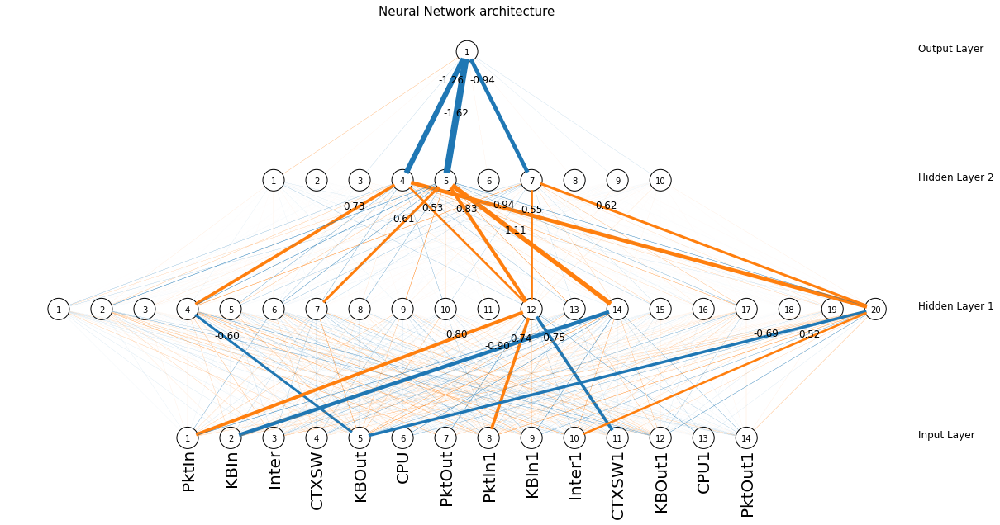

In [138]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

# Playgroud end


<a name="sandbox"></a>

# SandBox

Itt lehet egy teljes neurális hálón elejétől a végéig végig menni. Ki lehet próbálni, hogy egy adott változóhozt tartozó érték mellett milyen értéket vesz fel a becslés.

[Vissza](#tartalom)<br>


In [600]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1', 'AVG_RR1', 'SUM_RR1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler_X = preprocessing.MinMaxScaler()
min_max_scaler_y = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler_X.fit_transform(X)
y_scaled = min_max_scaler_y.fit_transform(y.values.reshape(-1, 1))

X_ = X_scaled
y_ = y_scaled

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(6, 4),
                           max_iter=3000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_, y_)

print('')

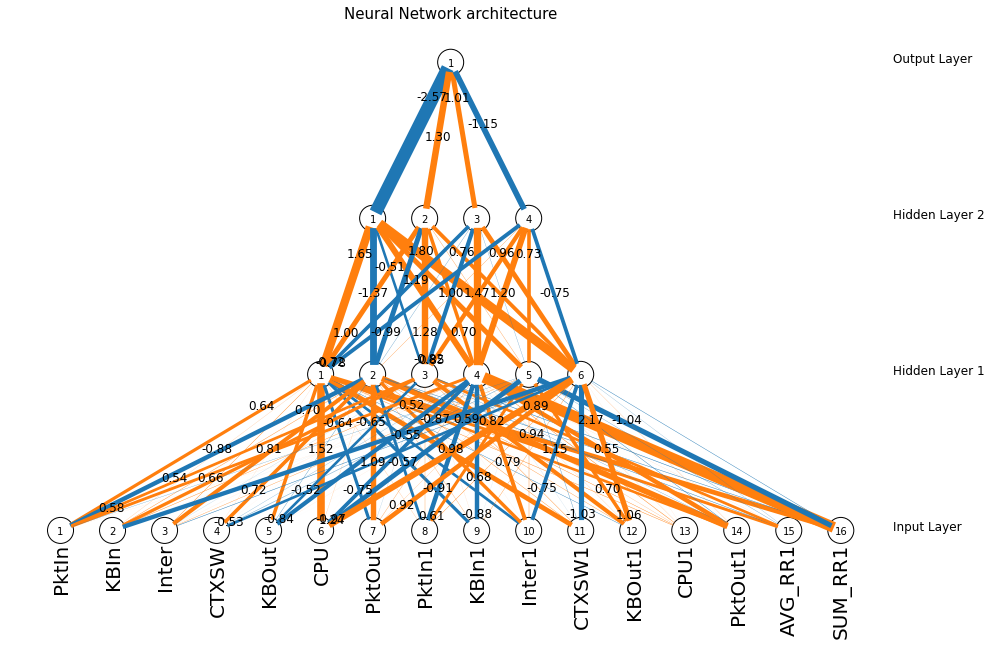

In [601]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

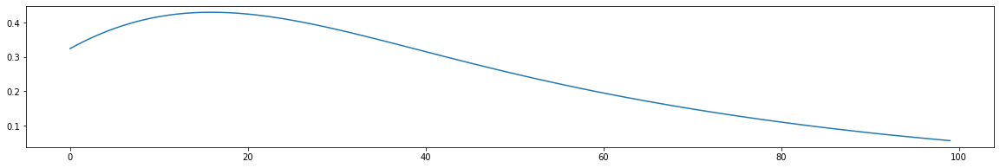

In [539]:
time = 300

tf = ba[columns]
input = tf.iloc[time]

x_array = np.arange(0, 100, 1)

predictions = []
for i in x_array:
  input['CPU'] = i
  X = min_max_scaler_X.transform([input])
  pred = mlp.predict(X)
  predictions.append(pred)

plt.figure(figsize=(20, 3))
plt.plot(predictions)
plt.show()

In [540]:
ido = 40
cpu = 100
matrix = np.zeros((ido, cpu))
for i in range(ido):
  input = tf.iloc[i]
  for j in range(cpu):
    input['CPU'] = j
    X = min_max_scaler_X.transform([input])
    pred = mlp.predict(X)
    matrix[i, j] = pred
    

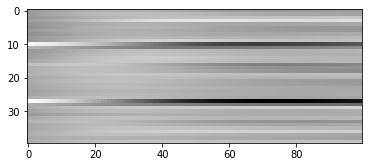

In [541]:
plt.imshow(matrix, cmap='gray'); plt.show()

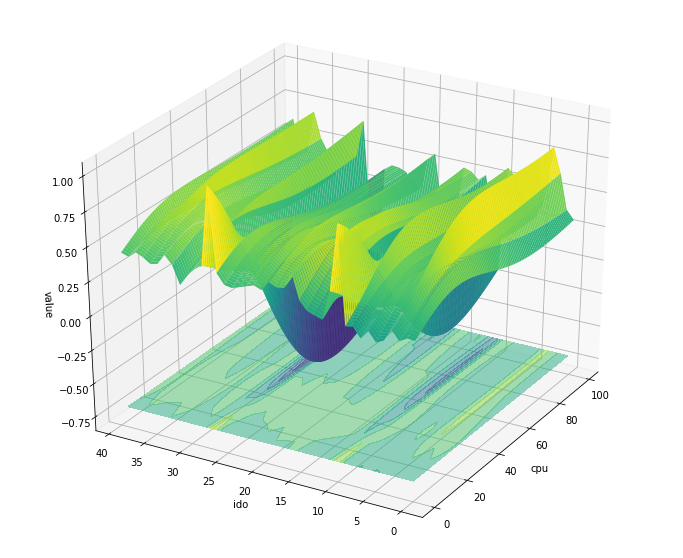

In [542]:
# Ha a mátrixot már korábban kiszámoltuk

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

z = matrix

# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = -0.7, cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

-----------------------------
40
100
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39.]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53.
 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71.
 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89.
 90. 91. 92. 93. 94. 95. 96. 97. 98. 99.]
-----------------------------


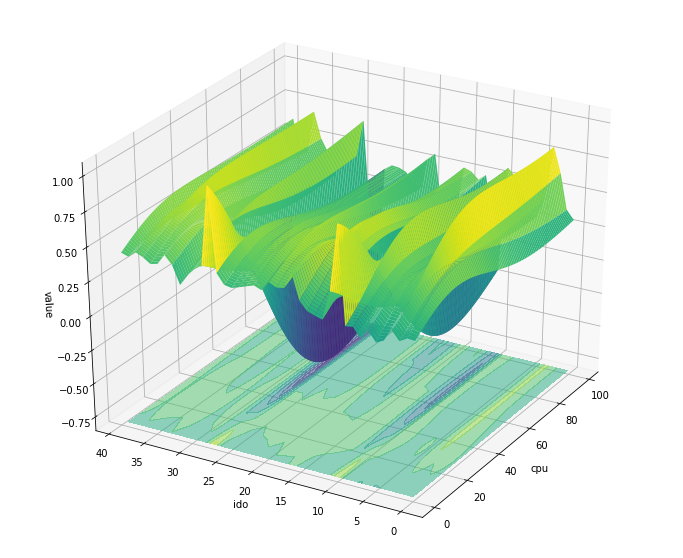

In [544]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

print('-----------------------------')
print(ido_space.size)
print(cpu_space.size)
print(ido_space)
print(cpu_space)
print('-----------------------------')

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

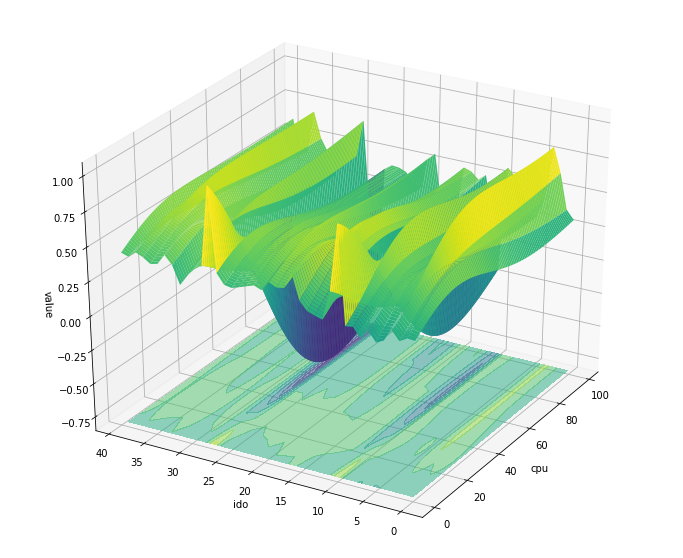

In [545]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100
part_ido = 40   # hány részre bontsuk az időt? Ha annyi mint az idő, akkor 1-es lépésközökkel haladunk
part_cpu = 100  # hány részre bontsuk a cput?  Ha annyi mint a  cpu, akkor 1-es lépésközökkel haladunk

ido_space = np.linspace(0, ido-1, part_ido)
cpu_space = np.linspace(0, cpu-1, part_cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

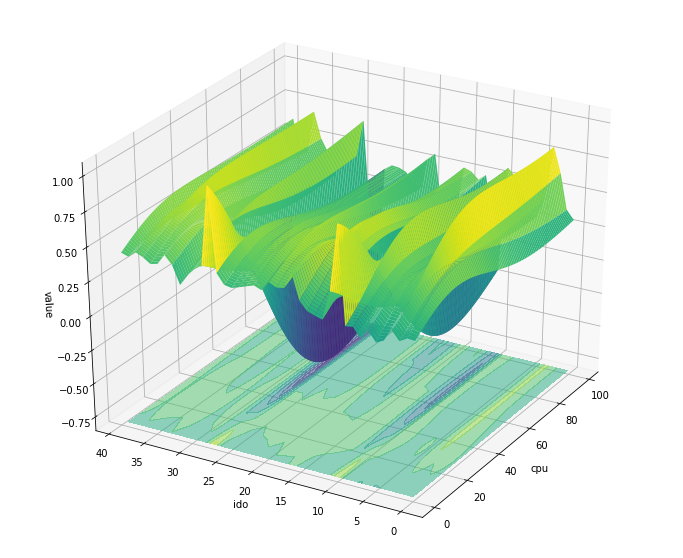

In [546]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [515]:
a = 10
b = 20

a = b + a

b = a - b

a = a - b

print(a, ', ', b)

20 ,  10


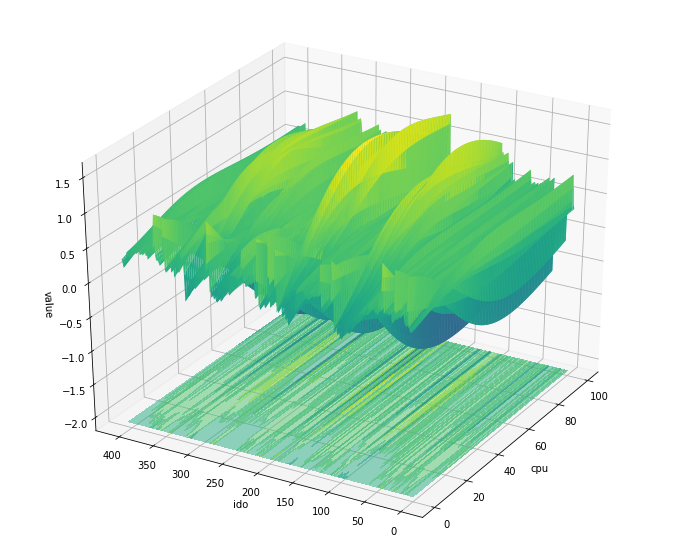

In [548]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
cpu = 101
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')


x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)


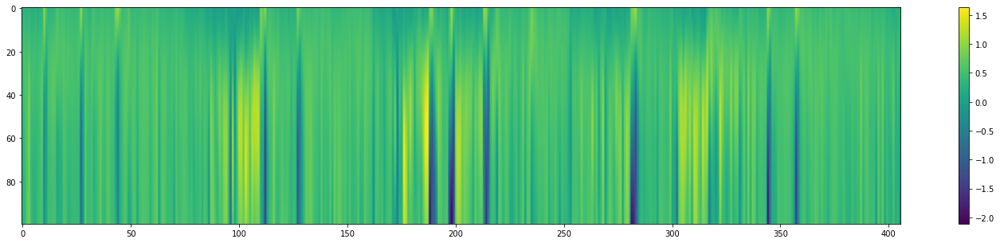

In [549]:

tf = ba[columns]

ido = 406
cpu = 100
cpu_space = np.arange(0, cpu, 1)
matrix = np.zeros((ido, cpu))
for i in range(ido):
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    matrix[i, j] = pred
    
plt.figure(figsize=(26, 5))
picture = plt.imshow(matrix.T)
plt.colorbar(picture)
plt.show()

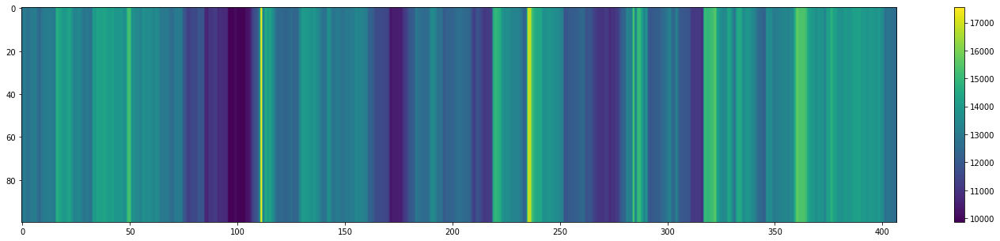

In [550]:
tmp = df['AVG_LAT_05'].values; s = tmp.size; tmp = tmp.repeat(100).reshape(s, 100)
plt.figure(figsize=(26, 5)); picture = plt.imshow(tmp.T); plt.colorbar(picture); plt.show()

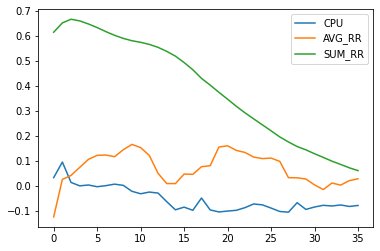

In [551]:
xcov = [crosscorr(df['CPU'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='CPU')
xcov = [crosscorr(df['AVG_RR'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='AVG_RR')
xcov = [crosscorr(df['SUM_RR'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='SUM_RR')
plt.legend(); plt.show()

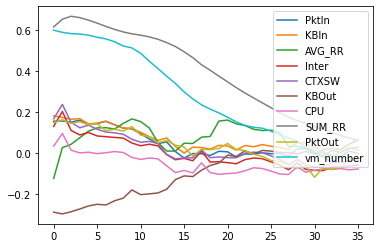

In [521]:
for j in df.columns:
  if( j != 'timestamp' and j != 'AVG_LAT_05'):
    xcov = [crosscorr(df[j], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label=j)
plt.legend(loc=1); plt.show()

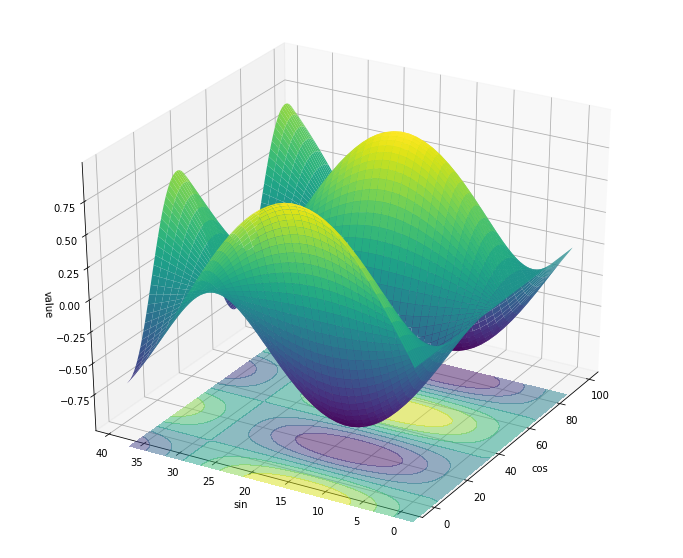

In [552]:
# Fun(i)

ido = 40
cpu = 100

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j in range(len(cpu_space)):
    j = int(j)
    z[i, j] = np.sin(i/10)*np.cos(j/10)

# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cos')
ax.set_ylabel('sin')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = -1.2, cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [523]:
surface = go.Surface(x = x, y = y, z = z)
data = [surface]

fig = go.Figure(data = data)

fig.update_layout(title = '', autosize=False,
                  width = 700, height = 500,
                  scene = dict(
                    xaxis_title = 'cos',
                    yaxis_title = 'sin',
                    zaxis_title = 'v'),
                  margin = dict(l = 65, r = 50, b = 65, t = 60))

fig.show()

In [553]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
cpu = 101
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')


x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


In [554]:
surface = go.Surface(x = x, y = y, z = z)
data = [surface]

fig = go.Figure(data = data)

fig.update_layout(title = '', autosize=False,
                  width = 700, height = 500,
                  scene = dict(
                    xaxis_title = 'cos',
                    yaxis_title = 'sin',
                    zaxis_title = 'v'),
                  margin = dict(l = 65, r = 50, b = 65, t = 60))

fig.show()

In [557]:
tf.describe()

,PktIn,KBIn,Inter,CTXSW,KBOut,CPU,PktOut,PktIn1,KBIn1,Inter1,CTXSW1,KBOut1,CPU1,PktOut1,AVG_RR1,SUM_RR1
count,406.000000,406.000000,406.000000,406.0,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000
mean,0.263824,0.026095,1065.468029,3900.0,0.715559,8.132328,0.232144,0.263865,0.026099,1065.357864,2177.347778,0.715552,8.133418,0.232103,0.048705,0.168060
std,0.031498,0.001822,109.218054,0.0,0.003240,3.666216,0.030804,0.031491,0.001821,109.237306,198.822226,0.003246,3.666031,0.030836,0.003266,0.070487
min,0.199641,0.022518,930.550000,3900.0,0.707213,6.167973,0.149783,0.199641,0.022518,930.550000,1867.150000,0.707213,6.167973,0.149783,0.028462,0.049964
25%,0.249932,0.024741,1027.023616,3900.0,0.713889,7.086068,0.212545,0.249932,0.024741,1026.969104,2107.047295,0.713877,7.086068,0.212521,0.049992,0.100002
50%,0.262497,0.026005,1051.576616,3900.0,0.715164,7.414346,0.233340,0.262502,0.026017,1051.458824,2154.357649,0.715164,7.420669,0.233340,0.050000,0.150009
75%,0.283310,0.027262,1069.214638,3900.0,0.716588,7.772807,0.250000,0.283310,0.027262,1069.214638,2193.430731,0.716588,7.772807,0.250000,0.050001,0.238782
max,0.423185,0.034276,2013.628074,3900.0,0.747438,38.441287,0.352188,0.423185,0.034276,2013.628074,3762.025187,0.747438,38.441287,0.352188,0.050038,0.300007


In [555]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 100   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(1000, 4000, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['CTXSW'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[1000. 1100. 1200. 1300. 1400. 1500. 1600. 1700. 1800. 1900. 2000. 2100.
 2200. 2300. 2400. 2500. 2600. 2700. 2800. 2900. 3000. 3100. 3200. 3300.
 3400. 3500. 3600. 3700. 3800. 3900.]


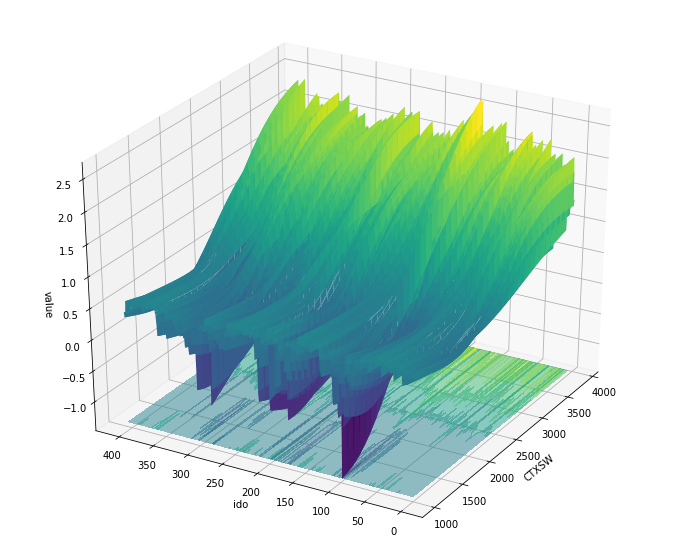

In [556]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('CTXSW')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [560]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 0.01   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(0, 0.8, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['KBOut1'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.42 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55
 0.56 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79]


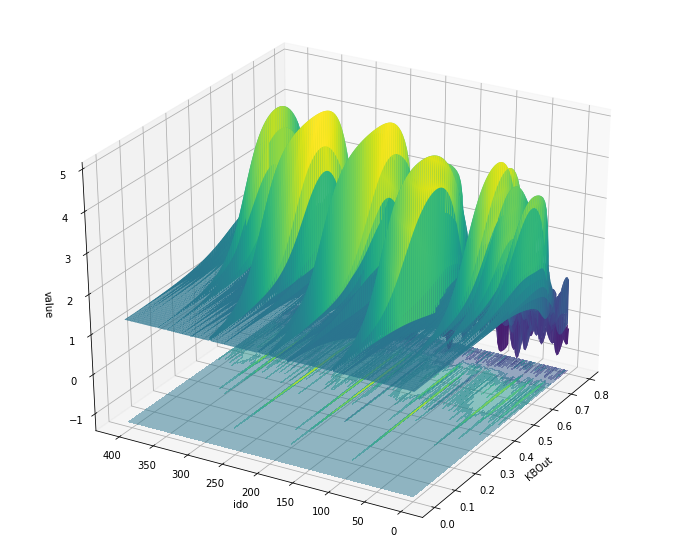

In [561]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('KBOut')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [564]:
tf.describe()

,PktIn,KBIn,Inter,CTXSW,KBOut,CPU,PktOut,PktIn1,KBIn1,Inter1,CTXSW1,KBOut1,CPU1,PktOut1,AVG_RR1,SUM_RR1
count,406.000000,406.000000,406.000000,406.000000,406.000000,406.0,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000
mean,0.263824,0.026095,1065.468029,2177.550356,0.715559,99.0,0.232144,0.263865,0.026099,1065.357864,2177.347778,0.715552,8.133418,0.232103,0.048705,0.168060
std,0.031498,0.001822,109.218054,198.800690,0.003240,0.0,0.030804,0.031491,0.001821,109.237306,198.822226,0.003246,3.666031,0.030836,0.003266,0.070487
min,0.199641,0.022518,930.550000,1867.150000,0.707213,99.0,0.149783,0.199641,0.022518,930.550000,1867.150000,0.707213,6.167973,0.149783,0.028462,0.049964
25%,0.249932,0.024741,1027.023616,2107.047295,0.713889,99.0,0.212545,0.249932,0.024741,1026.969104,2107.047295,0.713877,7.086068,0.212521,0.049992,0.100002
50%,0.262497,0.026005,1051.576616,2154.639822,0.715164,99.0,0.233340,0.262502,0.026017,1051.458824,2154.357649,0.715164,7.420669,0.233340,0.050000,0.150009
75%,0.283310,0.027262,1069.214638,2194.202242,0.716588,99.0,0.250000,0.283310,0.027262,1069.214638,2193.430731,0.716588,7.772807,0.250000,0.050001,0.238782
max,0.423185,0.034276,2013.628074,3762.025187,0.747438,99.0,0.352188,0.423185,0.034276,2013.628074,3762.025187,0.747438,38.441287,0.352188,0.050038,0.300007


In [602]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 0.005   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(0, 0.3, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['SUM_RR1'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[0.    0.005 0.01  0.015 0.02  0.025 0.03  0.035 0.04  0.045 0.05  0.055
 0.06  0.065 0.07  0.075 0.08  0.085 0.09  0.095 0.1   0.105 0.11  0.115
 0.12  0.125 0.13  0.135 0.14  0.145 0.15  0.155 0.16  0.165 0.17  0.175
 0.18  0.185 0.19  0.195 0.2   0.205 0.21  0.215 0.22  0.225 0.23  0.235
 0.24  0.245 0.25  0.255 0.26  0.265 0.27  0.275 0.28  0.285 0.29  0.295]


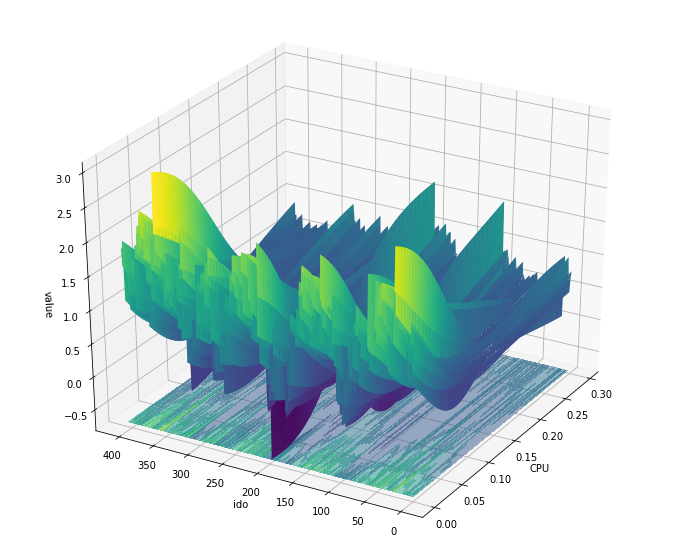

In [603]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('CPU')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

# Sandbox end

[SandBox](#sandbox)<br>
[Vissza](#tartalom)<br>

In [419]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [480]:
X = df.values

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

h = np.zeros((1, df.shape[0]))

for i, v in enumerate(df.columns):
  if( v != 'timestamp'):
    col = X_scaled[:,i]
    size = col.size
    col = col.reshape((1, col.size))
    col = col.T
    col = col.repeat(10, axis=0)
    col = col.reshape((size, 10))
    h = np.concatenate((h, col.T), axis=0)

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')


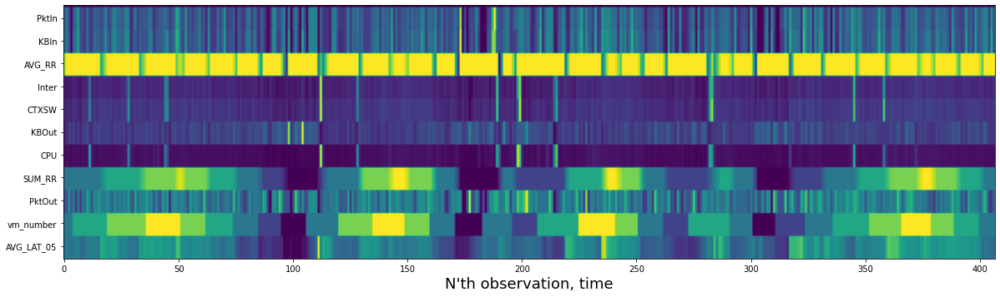

In [490]:
print(df.columns)
labels = df.columns[1:]
y = np.arange(5, 115, 10)
plt.figure(figsize=(20, 7)); plt.imshow(h); plt.yticks(y, labels, rotation='horizontal'); plt.xlabel('N\'th observation, time', fontsize=18); plt.show()

<a name="beforeafter"></a>

# Before After experiment

[vissza a tartalomhoz](#tartalom)

In [1]:
# Mivel az adataink között csak olyan adatok vannak ahol egy egységgel változott a gépek száma ezért megtehetjük a következőt

In [28]:
fd.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051', 'difference',
       'abs_difference'],
      dtype='object')

timestamp
r2_old =  0.9999992037403403
r2_vm1 =  0.999999222617348
r2_dif =  0.9999992206752776
r2_ref =  0.9999992314876396
r2_met =  0.5224471814814959
r2_mvm =  0.537649671822559
r2_mdf =  0.5725204727940854
r2_all =  0.5957811593366832
r2_x_1 =  0.5725204727940854


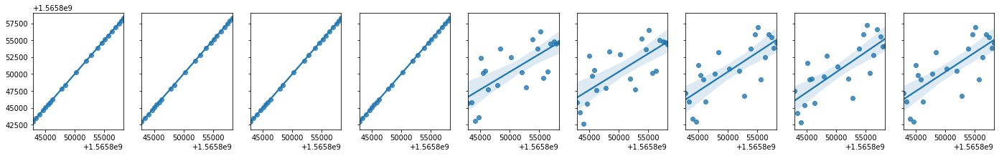

PktIn
r2_old =  0.015133023776734311
r2_vm1 =  0.0175209910633789
r2_dif =  0.04256642177308512
r2_ref =  0.05237742792542577
r2_met =  0.6421020775233188
r2_mvm =  0.6427113270628227
r2_mdf =  0.6421382863193374
r2_all =  0.6427200311959927
r2_x_1 =  0.6421382863193374


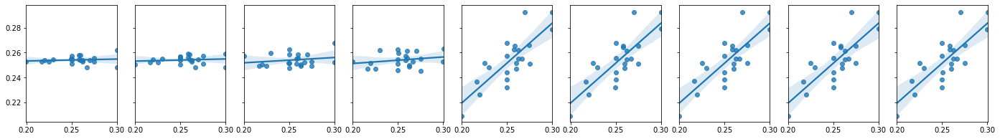

KBIn
r2_old =  0.02075717701167623
r2_vm1 =  0.022354374347468564
r2_dif =  0.06817624364729635
r2_ref =  0.0787787548893667
r2_met =  0.5867216050719626
r2_mvm =  0.587285128660435
r2_mdf =  0.5885720943573793
r2_all =  0.5889142864199508
r2_x_1 =  0.5885720943573793


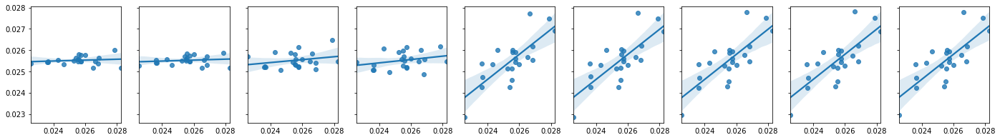

AVG_RR
r2_old =  0.03337364609475835
r2_vm1 =  0.03340177052769566
r2_dif =  0.6091806513703466
r2_ref =  0.7080884228878694
r2_met =  0.198243999583965
r2_mvm =  0.22329215411384595
r2_mdf =  0.7544291742140206
r2_all =  0.7587075431177465
r2_x_1 =  0.7544291742140206


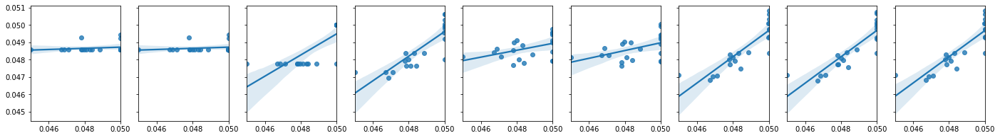

Inter
r2_old =  0.17911013321170421
r2_vm1 =  0.40862376614840257
r2_dif =  0.1856714658758627
r2_ref =  0.4107552627936355
r2_met =  0.7388581665987626
r2_mvm =  0.7401632192288584
r2_mdf =  0.7469778089481389
r2_all =  0.7476048547199043
r2_x_1 =  0.7469778089481389


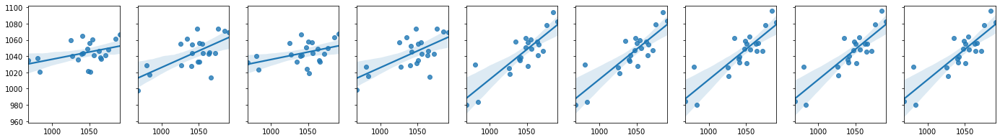

CTXSW
r2_old =  0.2066255713862556
r2_vm1 =  0.3320211398755193
r2_dif =  0.20703344852012795
r2_ref =  0.33661497977946664
r2_met =  0.8607903603425494
r2_mvm =  0.8632317409827879
r2_mdf =  0.8636354719273829
r2_all =  0.8668314840340137
r2_x_1 =  0.8636354719273829


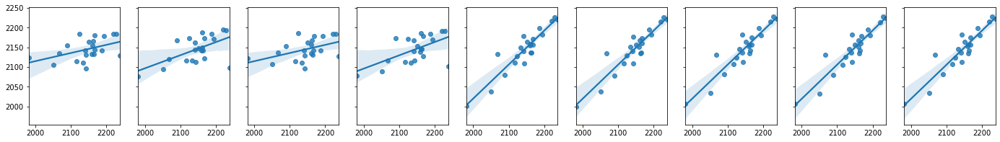

KBOut
r2_old =  0.2225476153505539
r2_vm1 =  0.43142632599393427
r2_dif =  0.24023862388982342
r2_ref =  0.43227350482693216
r2_met =  0.6674209220292351
r2_mvm =  0.6843383220345238
r2_mdf =  0.668377437050401
r2_all =  0.6845561595463752
r2_x_1 =  0.668377437050401


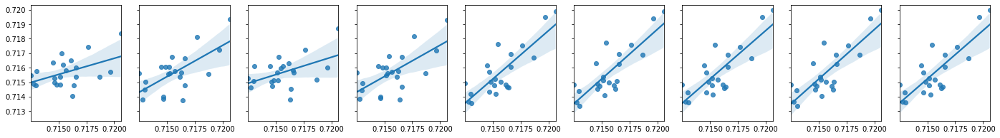

CPU
r2_old =  0.7421338819040775
r2_vm1 =  0.754076860885141
r2_dif =  0.7430405263063704
r2_ref =  0.7541383035559233
r2_met =  0.9155455364883939
r2_mvm =  0.9155989660154187
r2_mdf =  0.9200058938234297
r2_all =  0.9200070182637015
r2_x_1 =  0.9200058938234297


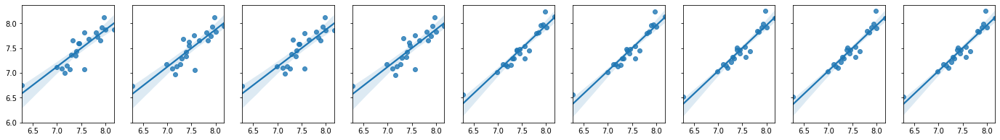

SUM_RR
r2_old =  0.9898530475936779
r2_vm1 =  0.9946967641563618
r2_dif =  0.9958200819804622
r2_ref =  0.9983614579334338
r2_met =  0.9965405587751768
r2_mvm =  0.9966485513739604
r2_mdf =  0.998834772254098
r2_all =  0.9988543969546099
r2_x_1 =  0.998834772254098


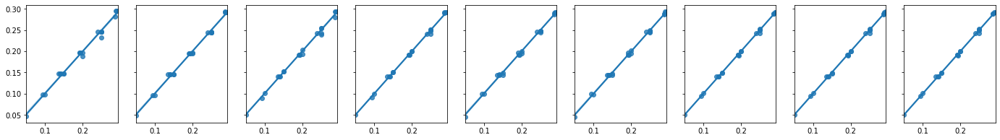

PktOut
r2_old =  0.00025380096973504074
r2_vm1 =  0.03996636303453671
r2_dif =  0.02548554864503616
r2_ref =  0.05087886913727113
r2_met =  0.46416550554253644
r2_mvm =  0.5096467377189806
r2_mdf =  0.46558031577066217
r2_all =  0.5097677361345836
r2_x_1 =  0.46558031577066217


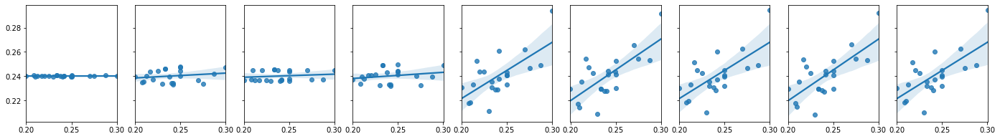

vm_number
r2_old =  0.5822697122209317
r2_vm1 =  0.5822697122209317
r2_dif =  1.0
r2_ref =  1.0
r2_met =  0.7298948816264978
r2_mvm =  0.7332207310255168
r2_mdf =  0.9999444929142507
r2_all =  1.0
r2_x_1 =  0.9999444929142507


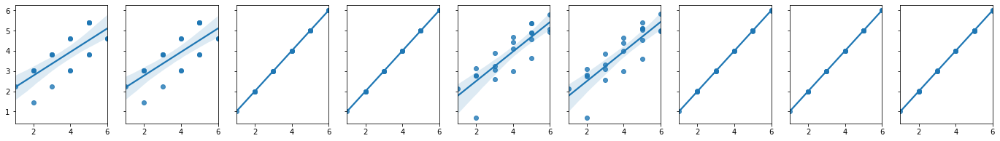

AVG_LAT_05
r2_old =  0.7723268933293272
r2_vm1 =  0.7781064064564363
r2_dif =  0.7992744421428746
r2_ref =  0.8367000165512996
r2_met =  0.6239601292388133
r2_mvm =  0.6257576570545127
r2_mdf =  0.7606891766645528
r2_all =  0.7607046118225096
r2_x_1 =  0.7606891766645528


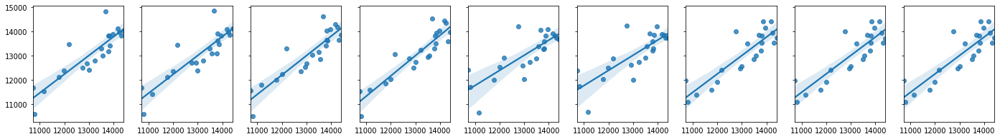

In [85]:
# Felskálázás

for i in df.columns:
  print(i)
  y     = fd[i].values
  x_old = fd[[str( i + '1' )]]
  x_vm1 = fd[[str( i + '1'), 'vm_number1']]
  x_dif = fd[[str( i + '1'), 'difference']]
  x_ref = fd[[str( i + '1'), 'vm_number1', 'difference']] # referencia
  x_met = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1']]
  x_mvm = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1']]
  x_mdf = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'difference']]
  x_all = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']]
  x_x_1 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'difference']]
  x_x_2 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']]
  x_x_3 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference', 'AVG_LAT_051']]

  # vm_number, AVG_LAT_051, difference (vm_number1, AVG_LAT_051 voltak eddig az allban benne, ami hiányzott az a diff)


  # meggondolás az, hogy ennek függetlennek kéne lennie a vm-ek számától, de egyébként meg ez sem feltétlenül igaz
  # mert 10 gépnél hozzáadok 1 vm-et akkor 10%-al növelem, ha 1-gépnél adok hozzá egyet akkor meg 50%-al

  regression = LinearRegression()

  # old
  model_old = regression.fit(x_old, y)
  y_pred_old = model_old.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)

  print('r2_old = ', r2_old)

  # vm1
  model_vm1 = regression.fit(x_vm1, y)
  y_pred_vm1 = model_vm1.predict(x_vm1)
  r2_vm1 = r2_score(y, y_pred_vm1)

  print('r2_vm1 = ', r2_vm1)

  # dif
  model_dif = regression.fit(x_dif, y)
  y_pred_dif = model_dif.predict(x_dif)
  r2_dif = r2_score(y, y_pred_dif)

  print('r2_dif = ', r2_dif)

  # x_ref
  model_ref = regression.fit(x_ref, y)
  y_pred_ref = regression.predict(x_ref)
  r2_ref = r2_score(y, y_pred_ref)

  print('r2_ref = ', r2_ref)

  # x_met
  model_met = regression.fit(x_met, y)
  y_pred_met = model_met.predict(x_met)
  r2_met = r2_score(y, y_pred_met)

  print('r2_met = ', r2_met)

  # x_mvm
  model_mvm = regression.fit(x_mvm, y)
  y_pred_mvm = model_mvm.predict(x_mvm)
  r2_mvm = r2_score(y, y_pred_mvm)

  print('r2_mvm = ', r2_mvm)

  # x_mdf
  model_mdf = regression.fit(x_mdf, y)
  y_pred_mdf = model_mdf.predict(x_mdf)
  r2_mdf = r2_score(y, y_pred_mdf)

  print('r2_mdf = ', r2_mdf)

  # x_all
  model_all = regression.fit(x_all, y)
  y_pred_all = model_all.predict(x_all)
  r2_all = r2_score(y, y_pred_all)

  print('r2_all = ', r2_all)

  # x_x_1
  model_x_1 = regression.fit(x_x_1, y)
  y_pred_x_1 = model_x_1.predict(x_x_1)
  r2_x_1 = r2_score(y, y_pred_x_1)

  print('r2_x_1 = ', r2_x_1)


  fig, axes = plt.subplots(1, 9, figsize=(24, 3), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_vm1)
  sns.regplot(ax=axes[2], x = y, y = y_pred_dif)
  sns.regplot(ax=axes[3], x = y, y = y_pred_ref)
  sns.regplot(ax=axes[4], x = y, y = y_pred_met)
  sns.regplot(ax=axes[5], x = y, y = y_pred_mvm)
  sns.regplot(ax=axes[6], x = y, y = y_pred_mdf)
  sns.regplot(ax=axes[7], x = y, y = y_pred_all)
  sns.regplot(ax=axes[8], x = y, y = y_pred_x_1)
  plt.show()



In [ ]:
# Regresszió
for i in df.columns:
  y     = fd[i].values               # Current
  x_old = fd[[str( i + '1' ), 'vm_number1']].values
  x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051']].values
  x_lat = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1']].values


  regression = LinearRegression()

  # fit old
  regression.fit(x_old, y)
  y_pred_old = regression.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)
  r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

  # fit new
  regression.fit(x_new, y)
  y_pred_new = regression.predict(x_new)
  r2_new  = r2_score(y, y_pred_new)
  r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')

  # fit without latency
  regression.fit(x_lat, y)
  y_pred_lat = regression.predict(x_lat)
  r2_lat  = r2_score(y, y_pred_lat)
  r2w_lat = r2_score(y, y_pred_lat, multioutput='variance_weighted')



  print(i)
  print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
  print('r2_lat  = ', r2_lat, '\t', 'r2w_lat = ', r2w_lat)
  print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


  fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_lat)
  sns.regplot(ax=axes[2], x = y, y = y_pred_new)
  # plt.savefig('before_after.png')
  plt.show()
  


# Keras implementation

Ugyan ez csak egy másik keretrendszerrel

In [ ]:
from keras.models import Sequential
from keras.layers import Dense

In [ ]:
# pre processing

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

i = 600
X_train = X_scaled[0:i,:]
y_train = y_scaled[0:i,:]
X_test  = X_scaled[i:,:]
y_test  = y_scaled[i:,:]

# set input dim
input_dim = X.shape[1]

# create model
model = Sequential()
model.add(Dense(10, input_dim=input_dim, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

# Fit the model
# history = model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)
history = model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0, validation_split=0.2)

# Evaluate scores
r2_train = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

# Predict the values
y_pred_train = model.predict(X_train)
y_pred_test  = model.predict(X_test)

In [ ]:
# Plot history
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='MAE (training data)')
plt.plot(history.history['val_loss'], label='MAE (validation data)')
plt.title('Mean Average Errors durint the training')
plt.ylabel('MAE value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:
timeline_plot(y_train, y_pred_train)

In [ ]:
timeline_plot(y_test, y_pred_test)

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html


Fuzzy Inference Part 4
<br>
https://www.youtube.com/watch?v=Q6QDVIwztyU


MathWorks - Fuzzy Logic Toolbox
<br>
https://www.mathworks.com/products/fuzzy-logic.html


MathWorks - Getting Started with Fuzzy Logic Toolbox, Part 1
<br>
https://www.mathworks.com/videos/getting-started-with-fuzzy-logic-toolbox-part-1-68764.html


MathWorks - Fuzzy Inference
<br>
https://www.mathworks.com/help/fuzzy/fuzzy-inference-process.html


MathWorks - Fuzzy Logic Controller
<br>
https://www.mathworks.com/help/fuzzy/fuzzylogiccontroller.html


Math AP®︎/College Statistics Confidence intervals Confidence intervals for proportions
<br>
https://www.khanacademy.org/math/ap-statistics/estimating-confidence-ap/one-sample-z-interval-proportion/v/conditions-for-valid-confidence-intervals

Getting Started with Fuzzy Logic Toolbox (Matlab)
<br>
https://www.youtube.com/watch?v=LupUhRJo_sU

How to work with Fuzzy Membership functions in Matlab
<br>
https://www.youtube.com/watch?v=vG3w4JVAKa0


Wikipedia - 'Fuzzy control system'
<br>
https://en.wikipedia.org/wiki/Fuzzy_control_system


Wikipedia - 'Fuzzy logic'
<br>
https://en.wikipedia.org/wiki/Fuzzy_logic

------------

[1]
Fuzzy Logic Toolbox for Python API
<br>
https://scikit-fuzzy.readthedocs.io/en/latest/api/skfuzzy.html

------------


Digitális Tankönyvtár - Fuzzy rendszerek
Kóczy T. László, Tikk Domonkos
<br>
https://regi.tankonyvtar.hu/hu/tartalom/tkt/fuzzy-rendszerek-fuzzy/ch03.html


Digitális Tankönyvtár - A bizonytalansági következtetés egyéb módszerei
<br>
https://regi.tankonyvtar.hu/hu/tartalom/tamop425/0026_mib_4_4/ch14s07.html


------------

Nagyon érdekes Demo - Fuzzy Car Simulator
<br>
https://github.com/daniel4lee/fuzzy-system



